<a href="https://colab.research.google.com/github/dngoins/UAV_Swarm_QLADTR/blob/main/Location_aware_Multi_Drone_Networking_with_Intelligent_Packet_Forwarding_using_Reinforcement_Learning_(QLearning).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div class="markdown-google-sans">
  <h2>Location aware Multi-Drone Networking with Intelligent Packet Forwarding</h2>
  <h3>Evalutation Notebook using Q-Learning methodolog</h3>
  <a href="https://www.overleaf.com/read/srrcbvscbtpf#0ff8ce">Main Document Here</a>
  </br>
  <a href="https://youtu.be/dRr9EfH1c7U?si=lP4qvanbkjZ2qG9u">Video Presentation Here</a>
  <p>Author: Dwight Goins - dgoins2019@fau.edu</p>
  <p>Author: Tiying Gao - tgao2024@fau.edu</p>
</div>

# Overview

## Description

The main goal of this code is to simulate and visualize the behavior of a network of Unmanned Aerial Vehicles (UAVs) using Q-learning. The UAVs have different roles (searching or ferrying) and their positions and velocities are updated over time. The Q-learning algorithm is used to optimize the actions of the UAVs to maximize a reward function, which includes factors such as successful data forwarding, minimizing data drops, and optimizing network conditions.

## Key Objectives:

1. **Simulation of UAV Network:** The code simulates a network of UAVs with different roles and behaviors.
2. **Q-Learning Optimization:** The UAVs use a Q-learning algorithm to learn optimal actions based on their states.
3. **Visualization:** The code visualizes the positions, velocities, and roles of the UAVs, both initially and after some steps, and creates an animated GIF to show the UAVs' movements and role changes over time.
4. **Performance Metrics:** The code prints the Q-table and V-table to show the learned values and policies after training.



## Steps in the Code:

1. **Initialization:** The environment and Q-learning agent are initialized.
2. **State Reset:** The initial state of the UAVs is set, with positions constrained within a grid and velocities assigned.
3. **Role Switching:** The UAVs' roles are switched based on actions chosen by the Q-learning agent.
4. **Visualization:** Initial and post-switching states are visualized using scatter plots and quiver plots for velocities.
5. **Animation:** An animated GIF is created to show the UAVs' movements and role changes over time.
6. **Policy Extraction:** The learned policy is extracted and the Q-table and V-table are printed.

## Summary:

The main goal is to use Q-learning to optimize the behavior of a network of UAVs and visualize their movements and role changes over time. The code aims to demonstrate how the UAVs learn to perform their tasks more effectively through reinforcement learning.

# Details


## Importing Packages Required

In [1]:

# Array math
import numpy as np

# Iteration tracking
from tqdm import tqdm

# Type hinting
from typing import Tuple

# Os traversal
import os

import numpy as np
import random

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation
from google.colab import drive
from google.colab import files
import io
from IPython.display import display, Image
from datetime import datetime  # Import datetime module
import time
import pandas as pd

import matplotlib.animation as animation
from matplotlib.patches import FancyArrowPatch

from sklearn.preprocessing import MinMaxScaler

import pickle


For rendering Greek letters in Latex for plotting

In [2]:
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams["text.latex.preamble"]  = r"\usepackage{cmbright}"
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

# Mounting G-Drive for saving files.
drive.mount('/content/gdrive')
drone_folder_path = '/content/gdrive/MyDrive/Drones'

if not os.path.exists(drone_folder_path):
    os.makedirs(drone_folder_path)
    print(f"Folder '{drone_folder_path}' created successfully.")
else:
    print(f"Folder '{drone_folder_path}' already exists.")

%cd {drone_folder_path}


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Folder '/content/gdrive/MyDrive/Drones' already exists.
/content/gdrive/MyDrive/Drones


In [3]:
def save_state(env, agent, episode, average_rewards, initial_states,
               final_states, filename='uav_location_aware_training_state.pkl'):
    state = {
        'env': env,
        'agent': agent,
        'episode': episode,
        'average_rewards': average_rewards,
        'initial_states': initial_states,
        'final_states': final_states
    }
    with open(filename, 'wb') as f:
        pickle.dump(state, f)
    print(f"State saved to {filename}")


def load_state(filename='uav_location_aware_training_state.pkl'):
    with open(filename, 'rb') as f:
        state = pickle.load(f)
    print(f"State loaded from {filename}")
    return state

## $UAV$ Routing problem as a Markov Decision Process (MDP)



### Goal

Forward data to the ground station $GS$ with highest reward

Before implementing Q-learning, the routing problem must be formulated as a Markov Decision Process (MDP). In an MDP, the system transitions between states based on the actions taken by the agent, with the aim of maximizing cumulative rewards. In the context of UAV routing, the states represent the UAV's current conditions, such as position, speed, and available neighbors. Actions correspond to decisions regarding data forwarding, like selecting a neighboring UAV or storing data for later transmission. Rewards are designed to incentivize successful data transmissions while penalizing delays or transmission failures. For example, successfully forwarding a data packet to a ground station would result in a high reward, while packet drops or inefficient hop selections would incur penalties. The transition function defines how the system moves from one state to another based on the action taken, which in this case is influenced by the movement of UAVs and fluctuating network conditions.

### MDP Design:

We will have agents, states, actions, rewards, transistions and policies which help determine rewards for transitions.

### Agents:

* $UAV_s$ - Searching Drone (Stable-Fixed Point)
* $UAV_f$ - Ferrying Drone (Moving)
* $GS$ - Ground station (Stable-Fixed Point - Goal)

### State Space $S$:

  State Space $S$: The state at any given time $t$ denoted as $s_t$ represents the network's current configuration for a $UAV_{s|f}$.
  
  This includes the $UAV_{s|f}$’s position within range of other $UAV_{s|f}$ and the $GS$, and network metrics such as RTT and goodput.
  
  A general state at time $t$ can be described as:

#### State Implementation

The State is represented as the State class with all it's properties and attributes:


To formulate the UAV routing problem as a Markov Decision Process (MDP), we define the essential components—states, actions, rewards, and transitions—mathematically.

### State Space $S_t$

State Space $S$: The state at any given time $t$ denoted as $s_t$ represents the network's current configuration. This includes the UAV’s position, velocity, buffer status, round trip time, goodput, and ground position. A general state at time $t$ can be described as:

\begin{equation}
    s_t = {pos_t, velocity_t,
    net\_condition_t, buf_t,
    rtt_t, goodput_t, role_t,
    status_t}
\end{equation}

The set of all possible states forms the state space $S$


In [4]:
# Define the UAV State class
class State:
    def __init__(self, id, position, velocity, role, ground_station,
                 network_condition, currentStatus, rtt, goodput,
                 bufferStatus = 0.25):
        self.position = position
        self.velocity = velocity
        self.role = role
        self.ground_station = ground_station
        self.network_condition = network_condition
        self.currentStatus = currentStatus
        self.rtt = rtt
        self.goodput = goodput
        self.buffer_status = bufferStatus
        self.id = id
        self.nearby_uavs = []  # Add nearby UAVs information
        self.update_conditions()

    def get_nearby_uavs(self, uav_positions, uav_roles, radius=0.2):
        distances = np.linalg.norm(uav_positions - self.position, axis=1)
        nearby_indices = np.where(distances < radius)[0]
        nearby_uavs = [(uav_positions[i],
                        uav_roles[i]) for i in nearby_indices if i != self.id]
        return nearby_uavs

    def calculate_distance_to_ground_station(self):
        return np.linalg.norm(self.position - self.ground_station)

    def update_conditions(self, uav_positions=[], uav_roles=[]):

        if len(uav_positions) == 0:
          self.nearby_uavs = []
          return

        self.nearby_uavs = self.get_nearby_uavs(uav_positions, uav_roles)

        distance = self.calculate_distance_to_ground_station()

        current_state_names = ["data-forwarded",
                               "data-received"]

        current_state_name = random.choice(current_state_names)

       # print(f'Distance to $GS$ = {distance}\n')
        if (distance < 0.3):
          # ok we're close to ground station...
          self.network_condition = 1
          self.goodput = np.random.choice([1, 0.5])
          self.rtt = np.random.choice([0, 0.5])
          self.buffer_status = np.random.choice([0, 0.5])
          self.currentStatus = "data-forwarded"
        elif (distance >= 0.3 and distance < 0.7):
          # ok we're mediocre from ground station
          self.network_condition = 0.5
          #self.buffer_status = np.random.uniform(0.05, .75)
          self.currentStatus = current_state_name
          #self.goodput = np.random.uniform(30, 100)
          #self.rtt = np.random.uniform(1, 7)

          # let's check for nearby uavs
          if (len(self.nearby_uavs) > 0):
          # check to see network condition of the nearby uav
            if (self.nearby_uavs[0][1] == 1):
              #we're good to say we have a good network
              self.network_condition = 1
              self.goodput = np.random.choice([1, 0.5])
              self.rtt = np.random.choice([0, 0.5])
              self.buffer_status = np.random.choice([0, 0.5])
              self.currentStatus = "data-forwarded"
            elif (self.nearby_uavs[0][1] == 0.5):
              self.network_condition = 0.5
              self.goodput = np.random.choice([1, 0.5])
              self.rtt = np.random.choice([0, 0.5])
              self.buffer_status = np.random.choice([0, 0.5])
              self.currentStatus = current_state_name
            else:
              #self.network_condition = 0
              #self.currentStatus = "data-dropped"
              self.goodput = np.random.choice([0, 0.5])
              self.rtt = np.random.choice([1, 0.5])
              self.buffer_status = np.random.choice([1, 0.5])

        elif (len(self.nearby_uavs) > 0):
          # else we're kind of far away from ground station
          self.network_condition = 0
          self.goodput = np.random.choice([0, 0.5])
          self.rtt = np.random.choice([1, 0.5])
          self.buffer_status = np.random.choice([1, 0.5])

          # check to see network condition of the nearby uav
          if (self.nearby_uavs[0][1] == 1):
            #we're good to say we have a good network
            self.network_condition = 0.5
            self.goodput = np.random.choice([1, 0.5])
            self.rtt = np.random.choice([0, 0.5])
            self.buffer_status = np.random.choice([0, 0.5])
            self.currentStatus = "data-forwarded"
          elif (self.nearby_uavs[0][1] == 0.5):
            self.network_condition = 0.5
            self.currentStatus = current_state_name
            self.goodput = np.random.choice([1, 0.5])
            self.rtt = np.random.choice([0, 0.5])
            self.buffer_status = np.random.choice([0, 0.5])

        else:
          # we're far, and there are no other uavs around
          self.network_condition = 0
          self.buffer_status = 1
          self.currentStatus = "data-dropped"
          self.goodput = np.random.choice([0, 0.5])
          self.rtt = np.random.choice([1, 0.5])



### UAV Environment

The UAV Environment is a 1x1 Grid with 10 random UAVs placed in their own quadrants. The Ground station is in the center.

The environment has a **reset()** function which sets the initial states. The UAVs are created with random states with their velocity (Scaled Magnitude, and direction), location, and role ($s$|$f$). The function is called for every new episode.





Initial Grid with UAVs:


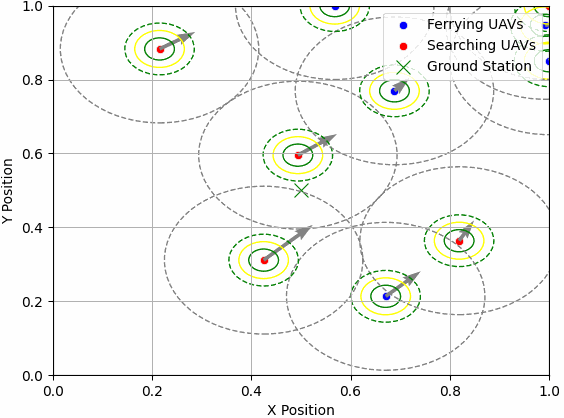

The environment also has a **step()** function which logically executes said action in some form or fashion and moves to the next step or action. For example the Switch to $UAV_f$ action switches the UAV role, while the $move$ action randomly moves the position within the same quadrant.


#### Action Space $A_{\psi}$

Action Space $A_{\psi}$: for the UAVs covers the possible actions or changes in state (transitions). The specific actions are as follows:

\begin{equation}
A_{\psi}(s_t,a_{t(i)})=\left\{\begin{matrix}
A_{move\_switch\_to\_UAV_f}(s^{role=0}_t,a_{t(i)}), & if a_{t(i)}=0\\
A_{move\_switch\_to\_UAV_s}(s^{role=1}_t,a_{t(i)}), & if a_{t(i)}=1\\
A_{forward\_data}(s^o_t,a_{t(i)}), & if a_{t(i)}=2\\
A_{stay\_receive\_data}(s^o_t,a_{t(i)}), & if a_{t(i)}=3, if s^{rtt}_{t(i)} < 10\\
A_{stay\_drop\_data}(s^o_t,a_{t(i)}), & if a_{t(i)}=3, if s^{rtt}_{t(i)}\geq10\\
A_{move}(s^o_t,a_{t(i)}), & \text{otherwise}
\end{matrix}\right.
\end{equation}


The Action space $A_{\psi}$ evaluation is implemented in the step function. Here the action helps to determine if the $UAV$ should move to another position or stay, change it's status from receiving data, to forwarding data, to dropping data. Based on these actions the state changes and is then assigned a reward value from the reward function.

#### Reward Function $R_{\Phi}$

Then environment also contains the **reward()** function. The reward function returns a numerical value depending on the $s_t$ and current action. As an example if the current status is named **"data-dropped"** then the reward is a -20, yet if the current status is named **"data-forwarded"** then if the data was forwarded to the ground station via proximity, then the reward is 100. If the state have a round trip time greater than 120 seconds, we assume a timeout occurred and the rewards is a -100.

The reward function encourages actions that maximize the packet delivery ratio, minimizes the end-to-end delay, and reduces the routing overhead. Successfully delivering a data packet to the $GS$ yields a positive reward, dropping a packet or experiencing a long delay yields a negative reward. The reward itself is a numerical value that represents the outcome of an action taken.

$R_{\Phi}$ assigns a numerical value to the outcome of an action in a given state. The objective is to encourage actions that lead to successful data delivery with minimal delay. The reward for taking action $a_t$in state$s_t$
and transitioning to state $s_t+1$ is denoted as $R_{\Phi}$($s_t,a_t$).

The reward function can be defined as the following:

\begin{equation}
R_{\Phi}(s_t, a_t)=\left\{\begin{matrix}
-2, & if s^{status}_{t(i)}="data-dropped"\\
+1.5, & if s^{rtt}_{t(i)}\leq5\\
-1, & if s^{rtt}_{t(i)}>5<10\\
-10, & if s^{rtt}_{t(i)}\geq10\\
+1.5, & if s^{goodput}_{t(i)}\geq50\\
-1, & if s^{goodput}_{t(i)}<50\\
+1.5, & if s^{buffer\_status}_{t(i)}\leq0.25\\
-1, & if s^{buffer\_status}_{t(i)}>0.25\\
+2, & if s^{status}_{t(i)}="data-forwarded"\\
+10, & if s^{status}_{t(i)}="data-forwarded", & if (s^{pos}_{t(i)} - s^{gs\_pos}_{t(i)})\leq0.3\\
+1, & if s^{status}_{t(i)}="data-received"\\
0, & \text{otherwise}
\end{matrix}\right.
\end{equation}

There are many positive and negative rewards possible as outlined above. The rewards are based on round trip time, goodput, network conditions (proximity to ground station), current status and remaining buffer capacity (buffer status). If the drone has dropped data, that is a negative reward. If the drone stays put and receives data, this is a positive reward. If the drone has forwarded the data to another ferrying drone that is a positive reward. If the drone forwards the data to the ground station by way of it's proximity to the ground station this is the highest reward (+100). Thus, the incentive is for the drone to move around to get the highest reward within the confines of it's environment.


#### Estimated Optimal Policy $L$:

The estimated optimal policy will determine the best action to take in each state to maximize the expected cumulative reward. This will be learned using the reinforcement learning algorithm Q-learning.

#### Transition Probability $P_{\gamma}$:


\begin{equation}
P_{\gamma}(s_t+1|s_t,a_t)
\end{equation}

Transition Probability $P_{\gamma}$: The transition probability $P_{\gamma}(s_t+1|s_t,a_t)$ defines the likelihood of moving from state $s_t$ to state $s_t+1$ after taking action $a_t$. In a UAV network, transitions are stochastic due to factors like mobility, link failures, and dynamic topology. The transition function is generally not explicitly known but is learned through interaction in the environment. In otherwords, the closer the UAV moves to a stronger network ($GS$ or $UAV_f$) the better.




### Environment


We will create a predetermined search area similar to a maze-like environment where:

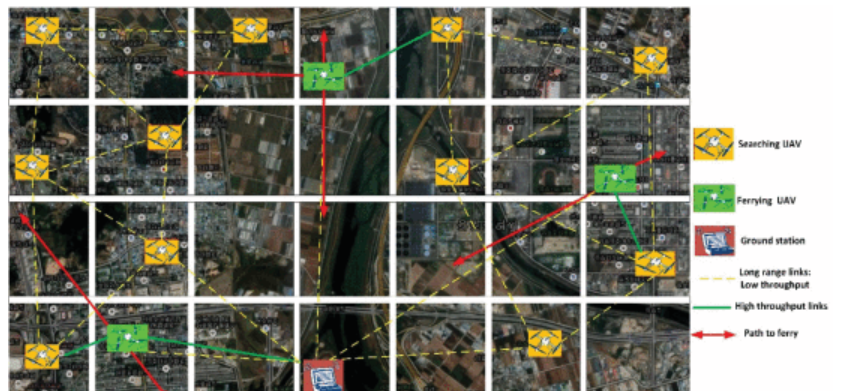


#### Goal

The goal is get the data delivered with the optimal policy with the correct $UAV_s$ to $UAV_F$ ratio that allows the best delivery of the data packets.

The environment also has a **is_done()** function. This function determines when the episode is done.

#### Policy and the movement rules

The policy will be uniform and the $UAV$s can move in any direction with equal probabilities.

If the $UAV$ tries to go out of bounds, meaning further than it's presribed search area,  it will stay in the same state.

When the $UAV_f$ reaches its goal state: $GS$ and delivers data the episode terminates.

When the maximum number of steps has been reached (signifying a timeout or serious delay) the episode terminates.

When there is a collision between any two $UAV$s the episode ends


The environment is represented as the **UAVEnvironment** class:



In [5]:

# Define the environment
class UAVEnvironment:
    def __init__(self, num_uavs, state_size, action_size, max_steps):
        self.num_uavs = num_uavs
        self.state_size = state_size
        self.action_size = action_size
        self.max_steps = max_steps
        self.steps = 0
        self.positions = np.zeros((num_uavs, 2))
        self.velocity_range = np.array([-0.4, -0.3, -0.2, -0.1, 0,
                                         0.1, 0.2, 0.3, 0.4])

        # Generate velocities for each UAV
        self.velocities = np.random.choice(self.velocity_range,
                                           size=(self.num_uavs, 2)) * 0.15

        self.roles = np.random.choice([0, 1],
                                      size=self.num_uavs,
                                      p=[0.65, 0.35])
        np.random.shuffle(self.roles)
        self.states = self.reset_states(num_uavs)
        self.grid = self.define_grid()

    def define_grid(self):
        num_cells = 10
        cell_size = 1 / num_cells
        cells = {}
        for i in range(num_cells):
            for j in range(num_cells):
                cells[(i, j)] = []
        for uav in self.states:
            cell_x = int(uav.position[0] / cell_size)
            cell_y = int(uav.position[1] / cell_size)
            cells[(cell_x, cell_y)].append(uav)
        return cells

    def is_within_cell(self, uav):
        cell_x = int(uav.position[0] / 0.1)
        cell_y = int(uav.position[1] / 0.1)
        return (cell_x, cell_y) in self.grid

    def is_within_range(self, uav1, uav2):
        distance = np.linalg.norm(uav1.position - uav2.position)
        return distance < 0.3

    def move_uav(self, uav, action):
        if action == 0:  # Switch to ferry
          uav.role = 1
        elif action == 1:  # Switch to Search
          uav.role = 0
        elif action == 2:  # Forward Data
          uav.currentStatus = "data-forwarded"
          uav.buffer_status = 0
        elif action == 3:  # Receive Data
          uav.currentStatus = "data-received"
          uav.buffer_status = 0.95
        elif action == 4:  # Stay and drop data
          uav.currentStatus = "data-dropped"
          uav.buffer_status = 1
        elif action == 5:  # Move
          # Update position based on velocity
          uav.position += (uav.velocity * 0.25)
          # Ensure positions stay within bounds
          uav.position = np.clip(uav.position, 0, 1)

          #Change velocity
          uav.velocity = np.random.choice(self.velocity_range) * 0.15
          # Ensure velocities stay within bounds
          uav.velocity = np.clip(uav.velocity, -0.4, 0.4)


          # Ensure UAV stays within the grid
        #  uav.position[0] = np.clip(uav.position[0], 0, 1)
        #  uav.position[1] = np.clip(uav.position[1], 0, 1)
        return uav


    def reset_states(self, num_uavs):
      self.steps = 0
      states = []

      # Initialize the state with random positions, velocities, and roles
      quadrants = [(i, j) for i in range(5) for j in range(5)]
      random.shuffle(quadrants)
      current_position =[0, 0]
      current_state_names = ["init", "data-forwarded",
                                "data-received"]

      # Stay within a specific quadrant of 0 to 1
      for i in range(self.num_uavs):
          qx, qy = quadrants[i]
          self.positions[i] = [random.uniform(qx * 0.2, (qx + 1) * 0.2),
                          random.uniform(qy * 0.2, (qy + 1) * 0.2)]
          current_position = self.positions[i]
          ground_station = np.array([0.5, 0.5])
          network_condition = np.random.choice([1, 0.5, 0])

          current_state_name = "init"
          #random.choice(current_state_names)

          # Random RTT choice 0 = fast, 0.5 = average, 1 = slow
          rtt = np.random.choice([0, 0.5, 1])

          if rtt == 1 and network_condition == 0:
              current_state_name = "data-dropped"

          # Random GoodPut 0 = no bandwidth, 0.5 = average, 1 = excellent
          goodput = np.random.choice([0, 0.5, 1])

          if goodput == 0 and network_condition == 0:
              current_state_name = "data-dropped"

          # Random Buffer Status 1 = full buffer, 0.5 = half full, 0 = empty
          bufferStatus = np.random.choice([1, 0.5, 0])

          if bufferStatus == 1 and rtt == 1:
              current_state_name = "data-dropped"

          state = State(id, current_position, self.velocities[i],
                        self.roles[i], ground_station,
                            network_condition, current_state_name, rtt,
                            goodput, bufferStatus)

          states.append(state)

      return states

    def reset(self):
        self.steps = 0
        self.states = self.reset_states(self.num_uavs)
        self.grid = self.define_grid()
        return self.states

    def step(self, action, uav_index):
        state = self.states[uav_index]
        next_state = self.update_state(state, action)
        reward = self.reward_function(state, action, next_state)
        done = self.is_done(next_state)
        self.states[uav_index] = next_state

        self.steps += 1
        if self.steps >= self.max_steps:
            done = True

        # Update conditions for all UAVs
        for uav in self.states:
            uav.update_conditions(self.positions, self.roles)
        return next_state, reward, done


    def update_state(self, state, action):
        self.move_uav(state, action)
        state.update_conditions(self.positions, self.roles)
        return state


    def reward_function(self, state, action, next_state):
        # Define the reward function
        reward = 0
        reward += next_state.network_condition
        # Penalty for collisions
        for uav_position, uav_role in state.nearby_uavs:
            if np.linalg.norm(next_state.position - uav_position) < 0.05:
                reward -= 1

        if state.role == 0:
            if not self.is_within_cell(state):
              reward -=2

            if state.network_condition == 1:
              reward += 5

        else:
            for other_uav_state in self.states:
              if other_uav_state == state:
                continue
              if other_uav_state.role == 0 \
              and self.is_within_range(state, other_uav_state):
                reward += 3

        # High reward for specific conditions
        # Search UAV and action is data forwarding
        if state.role == 0 and action == 5:
            for uav_position, uav_role in state.nearby_uavs:
                if uav_role == 1:  # Nearby UAV is a ferry UAV
                    distance = np.linalg.norm(next_state.position - uav_position)
                    if distance < 0.3:  # Within range
                        # Check network conditions, RTT, goodput,
                        # buffer status, and proximity to ground station
                        if (next_state.network_condition >= 0.5 and
                            next_state.rtt <= 0.5 and
                            next_state.goodput >= 0.5 and
                            next_state.buffer_status <= 0.5 and
                            np.linalg.norm(next_state.position \
                                           - next_state.ground_station) < 0.3):
                            reward += 10  # High reward


        # Additional reward for preventing dropped data packets
        if state.currentStatus == "data-dropped":
            reward -= 10  # Large negative reward for dropped data packets

        # Reward based on RTT
        if state.rtt <= 0.5:
            reward += 1.5  # High reward for RTT <= 5 seconds
        else:
            reward -= 1  # Negative reward for RTT > 5 seconds

        # Reward based on GoodPut
        if state.goodput >= 0.5:
            reward += 1.5  # High reward for GoodPut > 50 Mbps
        else:
            reward -= 1  # Negative reward for GoodPut <= 50 Mbps

        if state.buffer_status <= 0.5:
            reward += 5  # High reward for buffer status < 25%
        else:
            reward -= 1  # Negative reward for buffer status > 25%

        if state.currentStatus == "data-forwarded":
            reward += 2  # High reward for data forwarded
            distance = np.linalg.norm(state.position -
                                      state.ground_station)
            if (distance <= 0.3):
              # Additional reward for close proximity to ground station
              # we're good here
                reward += 1.5

        if state.currentStatus == "data-received":
            reward += 3  # High reward for data received

        # signifies a time out
        if state.rtt == 1:
          reward -= 10

        return reward

    def is_done(self, state):
        # Check if the episode is done
        if self.steps >= self.max_steps:
            return True  # Episode ends after max_steps

        for i in range(self.num_uavs):
            for j in range(i + 1, self.num_uavs):
               # Collision detection
                if np.linalg.norm(self.positions[i] - self.positions[j]) < 0.05:
                    return True  # Episode ends if there is a collision

            # Data delivery condition
            distance = np.linalg.norm(state.position -
                                      state.ground_station)
            #if (distance <= 0.3):
            if state.role == 1 and (distance <= 0.3):
                return True  # Episode ends if data is delivered

            nearby_uavs = state.get_nearby_uavs(self.positions, self.roles)
            if (state.role == 1 and  len(nearby_uavs) > 0):
                if nearby_uavs[0][1] == 1:
                  return True

        return False

# #test out
# env = UAVEnvironment(10,1000, 10, 25)
# print(env.velocity_range)
# env.move_uav(env.states[0], 5)
# print(env.states[0].position)


In [6]:

def GraphState(env, strLabel, ax, fig, show=False,
               overrideEnv=False, states=[]):

    if show == False:
      ax.clear()

    if(overrideEnv):
      initial_states = states
      initial_state = initial_states[len(initial_states) - 1 ]
    else:
      initial_states = env.states
      initial_state = initial_states[0]

    #for (initial_state) in initial_states:
      # Plot UAV positions using Seaborn
       # Ensure env.roles matches the size of env.positions
    searching_uavs = env.positions[env.roles[:len(env.positions)] == 0]

    # Ensure env.roles matches the size of env.positions
    ferrying_uavs = env.positions[env.roles[:len(env.positions)] == 1]

    sns.scatterplot(x=searching_uavs[:, 0], y=searching_uavs[:, 1],
                    ax=ax, color='blue', label='$UAV_s$')
    sns.scatterplot(x=ferrying_uavs[:, 0], y=ferrying_uavs[:, 1],
                    ax=ax, color='red', label='$UAV_f$')

    # Plot Ground Station
    sns.scatterplot(x=[initial_state.ground_station[0]],
                    y=[initial_state.ground_station[1]], color='green',
                   ax=ax, marker='x', s=100, label='$GS$')

    # add network range
    circle = plt.Circle(([initial_state.ground_station[0]],
                          [initial_state.ground_station[1]]),
                        0.25, color='gray', alpha=0.3,
                                  fill=True, linestyle='dashed')
    ax.add_patch(circle)

    # Add labels for UAVs
    for i, (x, y) in enumerate(env.positions):
        role = 's' if env.roles[i] == 0 else 'f'
        ax.text(x, y, f'$UAV^{i}_{role}$', fontsize=8, ha='right')

    # Add velocity vectors
    ax.quiver(env.positions[:, 0], env.positions[:, 1],
              env.velocities[:, 0], env.velocities[:, 1],
              angles='xy', scale_units='xy', scale=1, color='gray')

    # Add network condition circles
    for i, (x, y) in enumerate(env.positions):
        if initial_states[i].network_condition == 0:
            circle = plt.Circle((x, y), 0.03, color='red', fill=False,
                                linestyle='dashed')

        elif initial_states[i].network_condition == 0.5:
            circle = plt.Circle((x, y), 0.03, color='yellow', fill=False,
                                linestyle='dashed')

        else:
            circle = plt.Circle((x, y), 0.03, color='green', fill=False,
                                linestyle='dashed')

        ax.add_patch(circle)

    # Add goodput circles
    for i, (x, y) in enumerate(env.positions):
        if initial_states[i].goodput >= 75:
            circle = plt.Circle((x, y), 0.05, color='green', fill=False,
                                linestyle='dashed')

        elif initial_states[i].goodput < 75 and initial_state.goodput > 25:
            circle = plt.Circle((x, y), 0.05, color='yellow', fill=False,
                                linestyle='dashed')

        else:
            circle = plt.Circle((x, y), 0.05, color='red', fill=False,
                                linestyle='dashed')

        ax.add_patch(circle)


    # Add RTT circles
    for i, (x, y) in enumerate(env.positions):
        if initial_states[i].rtt < 4:
            circle = plt.Circle((x, y), 0.07, color='green',
                                fill=False, linestyle='dashed')

        elif initial_states[i].rtt >= 4 and initial_state.rtt < 7:
            circle = plt.Circle((x, y), 0.07, color='yellow',
                                fill=False, linestyle='dashed')

        else:
            circle = plt.Circle((x, y), 0.07, color='red',
                                fill=False, linestyle='dashed')

        ax.add_patch(circle)

        # add network range
        circle = plt.Circle((x, y), 0.20, color='gray',
                                  fill=False, linestyle='dashed')
        ax.add_patch(circle)


    # Plot settings
    # plt.title(strLabel)
    # plt.xlabel('X Position')
    # plt.ylabel('Y Position')
    # plt.legend(loc='upper right')  # Move legend to upper right
    # plt.grid(True)
    # plt.xlim(0, 1)  # Set x-axis limit
    # plt.ylim(0, 1)  # Set y-axis limit
    # plt.show()
    # plt.close(fig)

    ax.set_title(strLabel)
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    ax.legend(['$UAV_s$', '$UAV_f$',
                '$GS$'], loc='upper right')

    ax.grid(True)
    ax.set_xlim(0, 1)  # Set x-axis limit
    ax.set_ylim(0, 1)  # Set y-axis limit




In [7]:

# Initialize an empty DataFrame to store the data
data = pd.DataFrame(columns=['episode', 'buffer_status', 'network_conditions',
                             'roundtrip_time', 'goodput', 'position',
                             'currentStatus', 'uav_no'])

def record_data(episode, buffer_status, network_conditions,
                roundtrip_time, goodput, position, currentStatus, uav_no):
    global data
    new_data = pd.DataFrame({
        'episode': [episode],
        'buffer_status': [buffer_status],
        'network_conditions': [network_conditions],
        'roundtrip_time': [roundtrip_time],
        'goodput': [goodput],
        'position': [position],
        'currentStatus': [currentStatus],
        'uav_no': [uav_no]
    })
    data = pd.concat([data, new_data], ignore_index=True)

In [8]:

def plot_initial_final_states_highlights(env, initial_states, final_states, ax):

    # Highlight changes
    for initial_uav, final_uav in zip(initial_states, final_states):
        if initial_uav.id == final_uav.id:
            initial_pos = np.array(initial_uav.position)
            final_pos = np.array(final_uav.position)
            if not np.array_equal(initial_pos, final_pos):
                ax.arrow(initial_pos[0], initial_pos[1], final_pos[0] - initial_pos[0], final_pos[1] - initial_pos[1],
                             head_width=0.02, head_length=0.02, fc='green', ec='green')
            if initial_uav.role != final_uav.role:
                ax.text(initial_pos[0], initial_pos[1], 'Role Change', fontsize=12, color='purple')
            if initial_uav.network_condition != final_uav.network_condition:
                ax.text(initial_pos[0], initial_pos[1], 'Net Cond Change', fontsize=12, color='orange')


In [9]:
# Function to plot the data
# parameter: plotdata - the recorded data from record_data funtion
def plot_data(plotdata):

    scaler = MinMaxScaler()
    data = plotdata.copy()
    data[['buffer_status', 'roundtrip_time',
          'goodput', 'network_conditions']] = scaler.fit_transform(
        data[['buffer_status', 'roundtrip_time',
              'goodput', 'network_conditions']]
    )

    # Initialize the figure and subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Correlation Heatmap
    corr = data[['buffer_status', 'roundtrip_time',
                 'goodput', 'network_conditions']].corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm',
                 ax=axs[0])
    axs[0].set_title('Correlation Heatmap')

    # Heatmap of UAV Positions
    positions = data['position'].apply(pd.Series)
    positions.columns = ['x', 'y']
    positions['uav_no'] = data['uav_no']
    sns.scatterplot(x='x', y='y', hue='uav_no', data=positions,
                    palette='tab20', s=100, edgecolor='w', ax=axs[1])
    axs[1].scatter(0.5, 0.5, color='green', marker='x', s=100, label='$GS$')
    axs[1].set_title('Heatmap of UAV Positions')
    axs[1].set_xlabel('X Position')
    axs[1].set_ylabel('Y Position')
    axs[1].grid(True)

    # Boxplots for main metrics
    metrics = ['buffer_status', 'roundtrip_time',
               'goodput', 'network_conditions']
    # for i, metric in enumerate(metrics):
    #     sns.boxplot(x='episode', y=metric, data=data, ax=axs[1, 0])
    # axs[1, 0].set_title('Boxplots for Main Metrics')
    # axs[1, 0].set_xlabel('Episode')
    # axs[1, 0].set_ylabel('Value')

    # Joint KDE UAV Positions
    sns.kdeplot(x=positions['x'], y=positions['y'], cmap='Spectral',
                fill=True, ax=axs[2])
    axs[2].scatter(0.5, 0.5, color='green', marker='x', s=100, label='$GS$')
    axs[2].set_title('Joint KDE UAV Positions')
    axs[2].set_xlabel('X Position')
    axs[2].set_ylabel('Y Position')
    axs[2].grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

    # Remove the position field from the data
    data = data.drop(columns=['position'])

    # Time series plot for the four main topics
    data_melted = pd.melt(data, id_vars=['episode'],
                  value_vars=['buffer_status', 'roundtrip_time',
                              'goodput', 'network_conditions'])
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='episode', y='value', hue='variable', data=data_melted)
    plt.title('Time Series Plot for Main Metrics')
    plt.xlabel('Episode')
    plt.ylabel('Normalized Value')
    plt.legend(title='Metric')
    plt.grid(True)
    plt.show()

    # # multiple time series
    # sns.set_theme(style="dark")
    # plt.figure(figsize=(10, 6))

    # # Draw a pointplot to show pulse as a function of three categorical factors
    # g = sns.catplot(
    #     data=pd.melt(plotdata, id_vars=['episode', 'currentStatus'],
    #               value_vars=['buffer_status', 'roundtrip_time',
    #                           'goodput', 'network_conditions', 'currentStatus']),
    #      x="episode", y="value", hue="variable",
    #     col="currentStatus",
    #     capsize=.2, palette="YlGnBu_d", errorbar="se",
    #     kind="point", height=6, aspect=.75,
    # )
    # g.despine(left=True)
    # plt.title('3-way ANOVA against Status')
    # plt.show()

In [10]:
# Function to load data from a CSV file
def load_data(file_path):
    return pd.read_csv(file_path)


## Q Learning



Q learning is an online off-policy Temporal Difference (TD) algorithm for Markov Decision Processes to approximate the best optimal policy.

Definitions:

*Q value* - the value given for an action $a$ taken in state $s$. To put it more mathematically, it maps the actions and states to the real number plane:

$$Q(a \in \mathbb{A}, s \in \mathbb{S}) \rightarrow q \in  \mathbb{R}$$

In practice, the bigger the q value for an action is, the "better" the reward thus the better it is for the $UAV$ to take.

In comparison to the $UAV_s$ (searching drones), the $UAV_f$ will need to consistently move within range to have the best network state. The $UAV_s$ drone is assigned an area to search and will be somewhat confined to that area. However the $UAV_s$ may need to switch to a $UAV_f$ drone. The optimal policy will help us decide what the $UAV$ should do.

### *Q table*



The Q-table is a matrix storing the Q values where each row is a state and each column is an action.

*$\epsilon$-greedy policy* - the policy where, at every decision point, the agent takes a random action with the probability of 1 - $\epsilon$ and the action which has the biggest q value with the probability of $\epsilon$, where $\epsilon \in [0, 1]$.

*off-policy algorithm* - algorithms where the agent updates it's policy not using it's behavior policy.

*behavior policy* - the policy used by the $UAV$ to make an action.

Full algorithm for Q learning:

1. Hyperparameters:

    1.1 Define step size $\alpha \in (0, 1]$

    1.2 Define $\epsilon \in [0, 1]$

    1.3 Define the discount factor $\gamma \in (0, 1]$

    1.4 Initialize the Q table where all the values are arbitraty except for terminal states $Q(terminal, *) = 0$

    1.5 Define the number of episodes $N$.

2. Iterate for 1 to $N$:

    2.1 Pick a starting state s.

    2.2 Iterate until the $UAV_f$ reaches a terminal state:

    2.2.1 From the given state, pick an action $A$ using epsilon-greedy policy
      
    2.2.2 Take action $A$, observe the transition state $s^{'}$ and the reward $r$

    **2.2.3 Update the current Q value estimate:**

    $ Q(S, A) \leftarrow Q(S, A) + \alpha \left(r + \gamma \max_{a} Q(s^{'}, a) - Q(S, A)\right)$

    2.2.4 Set $s$ $\leftarrow$ $s^{'}$

The 2.2.3 update is the main part of the Q algorithm.


\begin{equation}
Q_{\psi}(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha \left[ R_{\Phi}(s_t, a_t) + \gamma \max_{a'} Q(s_{t+1}, a') - Q(s_t, a_t) \right].
\end{equation}


As we can see, in step 2.2.1, the behavior policy is the epslion-greedy policy.

But when we update the current Q value, we do not use that behaviour policy - we update the current Q value from the future state Q value and not use the epsilon-greedy policy anywhere.



The Q-Learning-Agent is implemented in the **QLearningAgent** class.

This class implements the Q-Learning algorithm, which is a type of reinforcement learning. It is responsible for choosing actions based on the current state, learning from the outcomes of those actions, and updating the Q-table accordingly. This allows the agent to learn optimal actions through exploration and exploitation. The Q-table is updated based on the rewards received, and the exploration rate decays over time to favor learned actions.

In [11]:
# Define the Q-Learning agent
class QLearningAgent:
    def __init__(self, state_size, action_size, alpha=0.01, gamma=0.95,
                 epsilon=1):
        self.state_size = state_size
        self.action_size = action_size
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.q_table = np.zeros((state_size, action_size))
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.995
        self.state_indices = {
            "data-forwarded": 0,
            "data-dropped": 1,
            "data-received": 2,
            "init": 3
        }  # Dictionary to map state strings to indices


    def choose_action(self, state, nearby_uavs):
        if np.random.rand() < self.epsilon:
            return np.random.randint(self.action_size)  # Explore
        else:
            state_index = self.get_state_index(state)

            # Get the base Q-values for the current state
            action_values = self.q_table[state_index]

            # Adjust action values based on nearby UAVs
            for uav_position, uav_role in nearby_uavs:
                distance = np.linalg.norm(state.position - uav_position)
                influence = 1 / (distance + 1e-5)  # Influence decreases with distance

                if(state.role != uav_role):
                  if uav_role == 0:  # If the nearby UAV is a search UAV
                    action_values[2] += influence  # Encourage forwarding data
                  elif uav_role == 1:  # If the nearby UAV is a ferry UAV
                    action_values[3] += influence  # Encourage receiving data

            # Select the action with the highest adjusted Q-value
            return np.argmax(action_values)

    def learn(self, state, action, reward, next_state):
        # Get state indices using the get_state_index method
        state_index = self.get_state_index(state)
        next_state_index = self.get_state_index(next_state)

        best_next_action = np.argmax(self.q_table[next_state_index])
        td_target = reward + self.gamma * self.q_table[next_state_index,
                                                       best_next_action]
        td_error = td_target - self.q_table[state_index, action]
        self.q_table[state_index, action] += self.alpha * td_error
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def get_state_index(self, state):
        # Convert state to a string
        state_str = f"{state.currentStatus}"
        # Convert state string to an integer index
        if state_str in self.state_indices:
            return self.state_indices[state_str]
        else:
            raise ValueError(f"Unknown state: {state}")

    def extract_policy(self):
        # Extract the best policy from the Q-table
        policy = np.argmax(self.q_table, axis=1)
        return policy

    def overlay_q_table_on_grid(self, env):
        fig, ax = plt.subplots(figsize=(12, 12))
        num_cells = 10
        cell_size = 1 / num_cells

        #Up, Down, Left, Right, Stay, Forward, Drop, Receive,
        # SwitctSearch, SwitchFerry
        actions = ["U", "D", "L", "R", "S", "F", "D", "R", "SS", "SF"]

        for cell_x in range(num_cells):
            for cell_y in range(num_cells):
                state_index = self.get_index_from_state(cell_x, cell_y,
                                                        num_cells)
                if state_index < self.q_table.shape[0]:
                    q_values = self.q_table[state_index]
                    text = "\n".join([f"{actions[i]}: {q_values[i]:.2f}" \
                                      for i in range(self.action_size)])
                    ax.text(cell_x * cell_size + cell_size / 2,
                            cell_y * cell_size + cell_size / 2,
                            text,
                            ha='center', va='center', fontsize=8)
                else:
                    ax.text(cell_x * cell_size + cell_size / 2,
                            cell_y * cell_size + cell_size / 2,
                            "n/a",
                            ha='center', va='center', fontsize=8)

        # Plot settings
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_title('Q-Table Overlay on Grid')
        plt.grid(True)
        plt.show()

    def get_index_from_state(self, cell_x, cell_y, num_cells):
        return cell_y * num_cells + cell_x


### Training the Q-Learning Agent

This function is responsible for training the Q-learning agent in the UAV Environment. It initializes the environment and the agent, runs the training episodes and visualizes the UAV positions and movements. It also extracts and prints the learned policy.

In [12]:
def train_q_learning_agent(num_episodes, num_uavs, state_size,
                           action_size, max_steps):


  # Define the path to the folder containing images on Google Drive
  drive_folder_path = '/content/gdrive/MyDrive/Drones'

  # Get the current date
  current_date = datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")

  # Initialize environment and agent
  env = UAVEnvironment(num_uavs, state_size, action_size, max_steps)
  agent = QLearningAgent(state_size, action_size)
  final_states = []
  average_rewards = []

  # Load state if available
  try:
      loaded_state = load_state()
      env = loaded_state['env']
      agent = loaded_state['agent']
      start_episode = loaded_state['episode']
      average_rewards = loaded_state['average_rewards']
      initial_states = loaded_state['initial_states']
      final_states = loaded_state['final_states']
  except FileNotFoundError:
      start_episode = 0

  if (start_episode == num_episodes):
    start_episode = 0

  # Initial state visualization
  initial_states = env.reset()

  fig, axs = plt.subplots(1, 2, figsize=(15, 7))
  ax0 = axs[0]
  ax1 = axs[1]

  #GraphState( env, f"Initial State", ax0, fig, False)
  #plt.show()
  #plt.close(fig)

  # Initialize cumulative reward
  cumulative_reward = 0

  # Run Q-learning
  for episode in tqdm(range(start_episode, num_episodes)):
    strEpisode = (f"Episode {episode + 1}/{num_episodes}")
    #print(strEpisode + "\n")
    GraphState(env,
                     f"Initial State - Episode - {episode+1}", ax0, fig, False)
    #plt.show()


    def update(frame, env, ax, fig, states ):

      nonlocal cumulative_reward
      nonlocal ax0
      nonlocal ax1
      nonlocal episode
      nonlocal agent


      #state = states[0]
      for state in states:
        for uav_index in range(num_uavs):

          record_data(episode, state.buffer_status, state.network_condition,
                      state.rtt, state.goodput, state.position,
                      state.currentStatus, uav_index)

          # Get nearby UAVs for the current UAV
          nearby_uavs = state.get_nearby_uavs(env.positions, env.roles)

          # Pass nearby_uavs to choose_action
          action = agent.choose_action(state, nearby_uavs)

          next_state, reward, done = env.step(action, uav_index)
          agent.learn(state, action, reward, next_state)
          cumulative_reward += reward

          state = next_state
          states[uav_index] = next_state
          if done:
              continue


        # Update the UAV plot
        # only graph the 1st and every 25th after
        GraphState(env,
                   f"UAV Anim Step - {frame}",
                   ax1, fig, False)

    if (episode % 10000 == 0):

      states = initial_states
      ani = FuncAnimation(fig, update, frames=max_steps, fargs=(env,
                          ax1, fig, states,),
                          repeat=True, blit=False)  # Ensure the animation loops

      #cumulative_reward = reward_list[0]
      #print(cumulative_reward)
      average_reward = cumulative_reward / env.max_steps
      average_rewards.append(average_reward)
      #print(f"Average Reward: {average_reward}\n")
      print(f"Episode {episode + 1}/{num_episodes} " + \
            f"- Average Reward: {average_reward}\n")

      animation_filename = f'ql_animation_{current_date}.gif'

      ani.save(drive_folder_path + '/' + animation_filename,
            writer='pillow', fps=10)

      # Display the animated GIF for UAV network
      display(Image(filename=drive_folder_path + '/' + animation_filename))

    final_states = env.states.copy()
    states = env.reset()

    if (episode % 10000 == 0):
      plt.show()
      plt.grid(True)
      plt.close(fig)
      # Print Q-Table and V-Table
      print("\nQ-Table:\n")
      print(agent.q_table)
      print("\nV-Table (State Values):\n")
      v_table = np.max(agent.q_table, axis=1)
      print(v_table)
      print("\n")
      # agent.print_q_table()
      #agent.overlay_q_table_on_grid(env)
      # extract policy
      policy = agent.extract_policy()
      print("Policy:")
      print(policy)
      print("\n")



    if episode % 1000 == 0:
      save_state(env, agent, episode, average_rewards, initial_states,
                 final_states)

    if (episode % 10000 == 0):
      plot_data(data)

      if (len(average_rewards) > 0):
        plt.plot(average_rewards)
        plt.xlabel('Episode')
        plt.ylabel('Average Reward')
        plt.title('Average Reward per Episode')
        plt.grid(True)
        plt.show()

      # # Print Q-Table and V-Table
      # print("\nQ-Table:\n")
      # print(agent.q_table)
      # print("\nV-Table (State Values):\n")
      # v_table = np.max(agent.q_table, axis=1)
      # print(v_table)
      # print("\n")
      # # agent.print_q_table()
      # #agent.overlay_q_table_on_grid(env)
      # # extract policy
      policy = agent.extract_policy()
      # print("Policy:")
      # print(policy)
      # print("\n")

      # Get the current date and time
      now = datetime.now()
      timestamp = now.strftime("%Y%m%d")

      # Save the data with positions to a
      # CSV file with date and time in the file name
      file_name = f"uav-location-aware-data-{timestamp}.csv"
      data.to_csv(file_name, index=False)

      #save policy and q_table to file
      np.save(drive_folder_path + \
              f'/uav-location-aware-{current_date}-policy.npy', policy)
      np.save(drive_folder_path + \
              f'/uav-location-aware-{current_date}-q_table.npy', agent.q_table)


    # Decay epsilon
    epsilon = max(agent.epsilon_min, agent.epsilon * agent.epsilon_decay)

    # Optionally, monitor performance and adjust max_episodes if needed
    if episode % 1000 == 0:
        print(f"Episode {episode}, Epsilon {epsilon:.4f}\n")


  policy = agent.extract_policy()

  #save policy and q_table to file
  np.save(drive_folder_path + \
          f'/uav-location-aware-{current_date}-policy.npy', policy)
  np.save(drive_folder_path + \
          f'/uav-location-aware-{current_date}-q_table.npy', agent.q_table)

  final_states = env.states.copy()

  return [agent, initial_states, final_states, average_rewards]

In [13]:
# Calculate metrics
def calculate_metrics(states):
    avg_distance = np.mean(
        [np.linalg.norm(state.position - state.ground_station) for state in states])
    avg_network_condition = np.mean(
        [state.network_condition for state in states])
    avg_goodput = np.mean([state.goodput for state in states])
    avg_rtt = np.mean([state.rtt for state in states])
    avg_buffer_status = np.mean([state.buffer_status for state in states])
    return avg_distance, avg_network_condition, avg_goodput, avg_rtt, avg_buffer_status


State Size: 437400
/content/gdrive/MyDrive/Drones


  0%|          | 0/100000 [00:00<?, ?it/s]

Episode 1/100000 - Average Reward: 0.0



<ipython-input-7-b083148f5970>:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data, new_data], ignore_index=True)


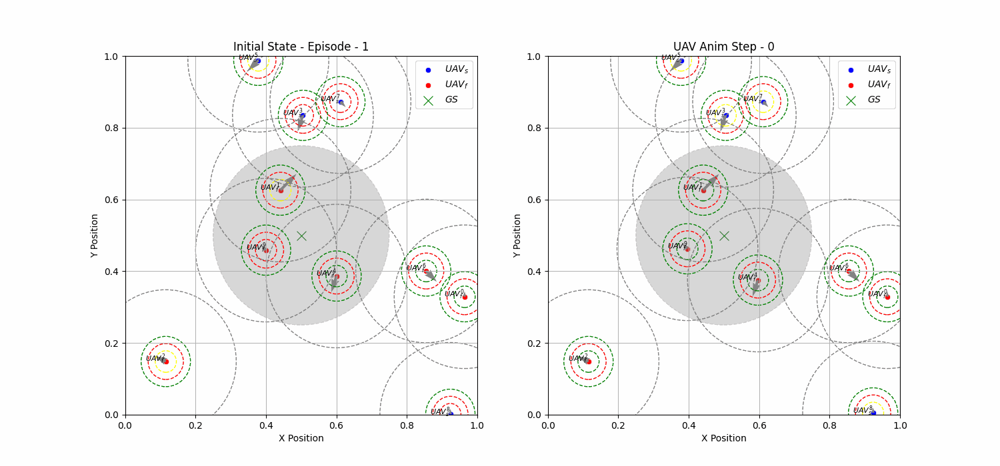

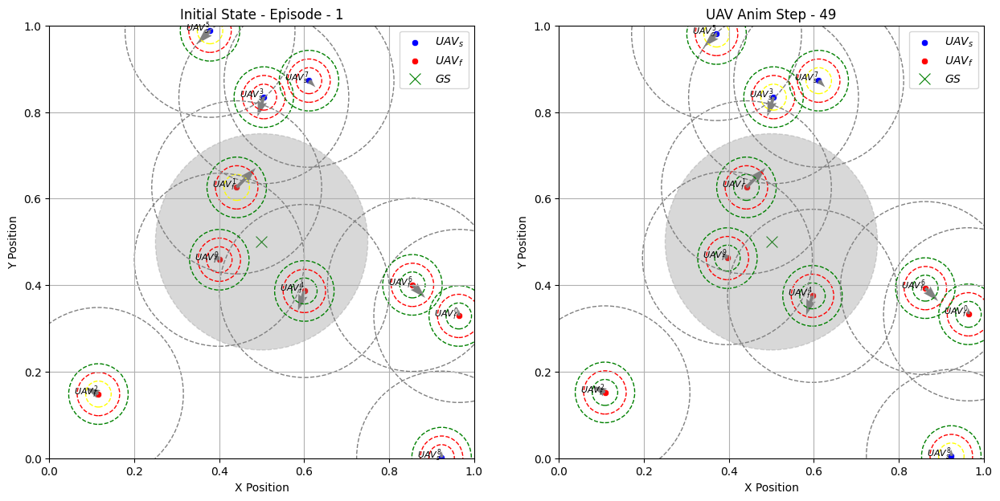


Q-Table:

[[3.23400631e+06 7.93747392e+05 8.30293450e+07 ... 1.50447759e+06
  4.24934385e+04 4.04493919e+06]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [7.47494092e+05 4.74412013e+05 8.58295501e+07 ... 7.30077374e+05
  1.35165117e+06 9.42187279e+05]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]

V-Table (State Values):

[83029344.9887619         0.         85829550.08069904 ...
        0.                0.                0.        ]


Policy:
[2 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


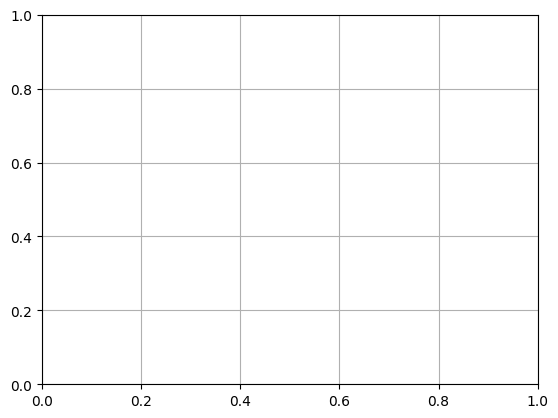

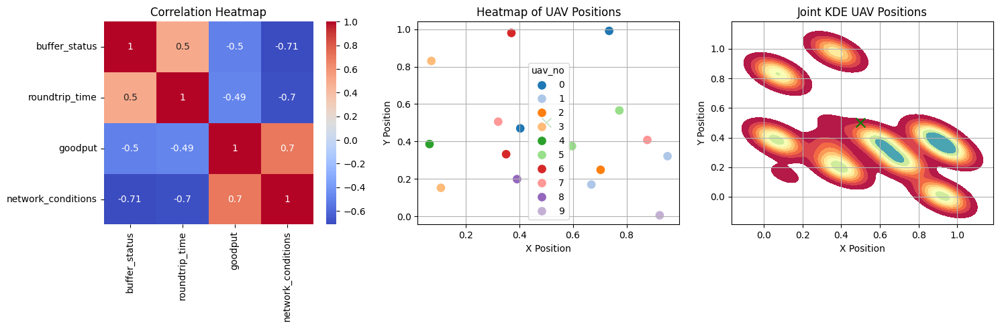

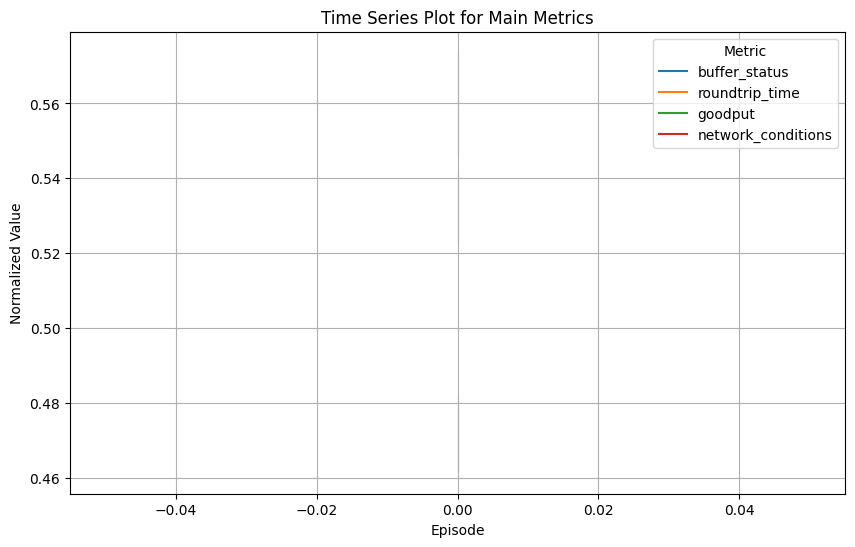

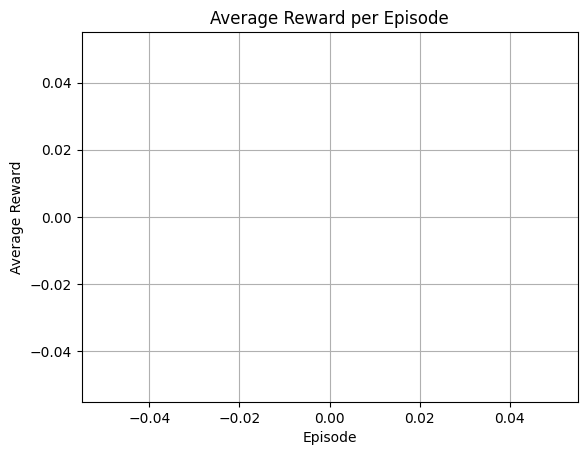

  0%|          | 1/100000 [02:21<3927:40:21, 141.40s/it]

Episode 0, Epsilon 0.0100



  1%|          | 1001/100000 [06:10<6:56:50,  3.96it/s]

State saved to uav_location_aware_training_state.pkl
Episode 1000, Epsilon 0.0100



  2%|▏         | 2001/100000 [09:59<7:13:33,  3.77it/s]

State saved to uav_location_aware_training_state.pkl
Episode 2000, Epsilon 0.0100



  3%|▎         | 3001/100000 [13:43<6:23:32,  4.22it/s]

State saved to uav_location_aware_training_state.pkl
Episode 3000, Epsilon 0.0100



  4%|▍         | 4001/100000 [17:21<6:41:59,  3.98it/s]

State saved to uav_location_aware_training_state.pkl
Episode 4000, Epsilon 0.0100



  5%|▌         | 5001/100000 [20:58<7:12:03,  3.66it/s]

State saved to uav_location_aware_training_state.pkl
Episode 5000, Epsilon 0.0100



  6%|▌         | 6001/100000 [24:36<6:45:31,  3.86it/s]

State saved to uav_location_aware_training_state.pkl
Episode 6000, Epsilon 0.0100



  7%|▋         | 7001/100000 [28:13<6:01:50,  4.28it/s]

State saved to uav_location_aware_training_state.pkl
Episode 7000, Epsilon 0.0100



  8%|▊         | 8002/100000 [31:49<5:44:41,  4.45it/s]

State saved to uav_location_aware_training_state.pkl
Episode 8000, Epsilon 0.0100



  9%|▉         | 9001/100000 [35:27<6:15:15,  4.04it/s]

State saved to uav_location_aware_training_state.pkl
Episode 9000, Epsilon 0.0100



 10%|█         | 10000/100000 [39:10<6:20:29,  3.94it/s]

Episode 10001/100000 - Average Reward: 1039.72



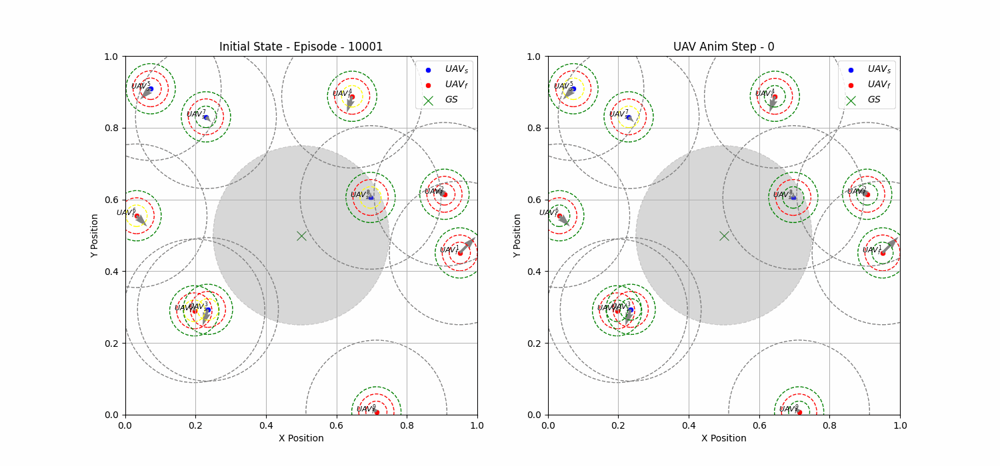


Q-Table:

[[ 5959709.27724623  4122759.23861639 53109037.47492793 ...
   2946716.45370484  2737476.38190393  7437517.89047385]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [  747494.09218242   474412.0129422  61203017.33270775 ...
    730077.37398858  1900248.29883491   942187.2794362 ]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[53109037.47492793        0.         61203017.33270775 ...
        0.                0.                0.        ]


Policy:
[2 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


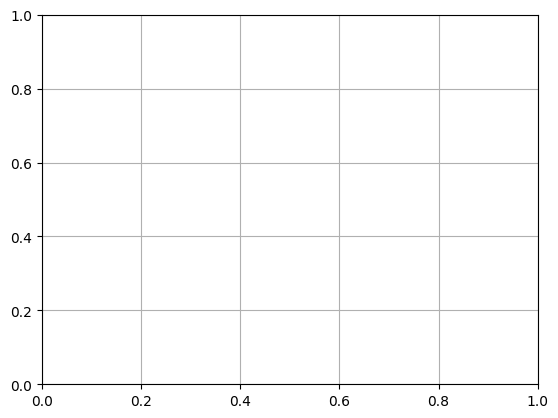

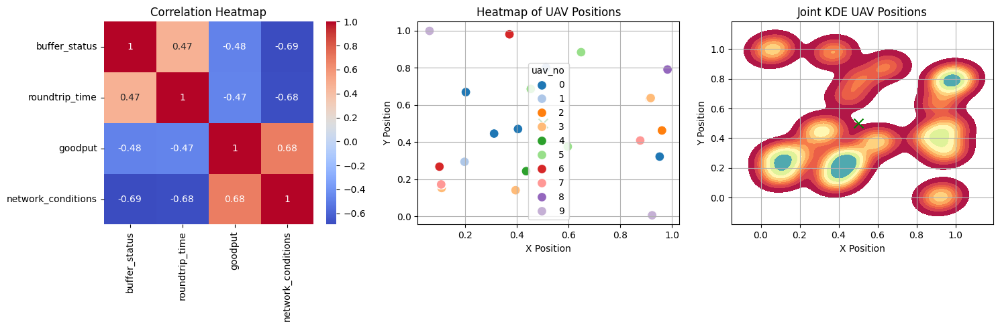

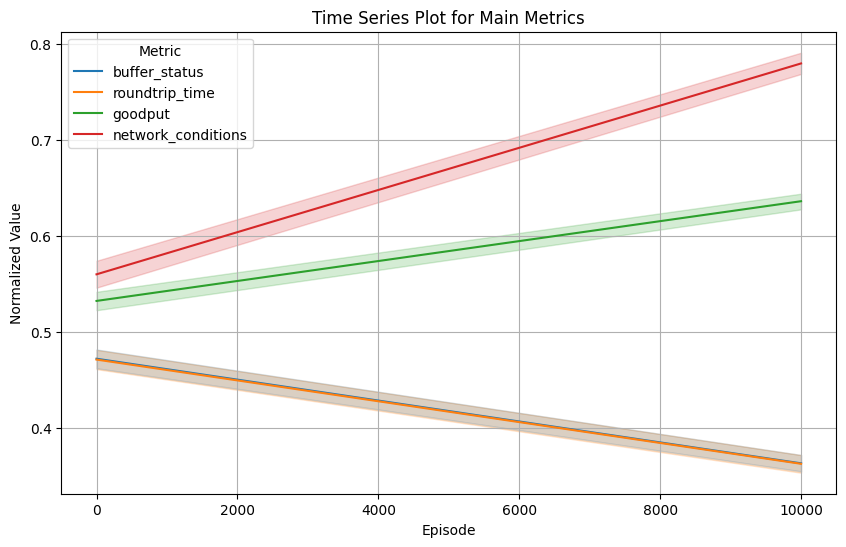

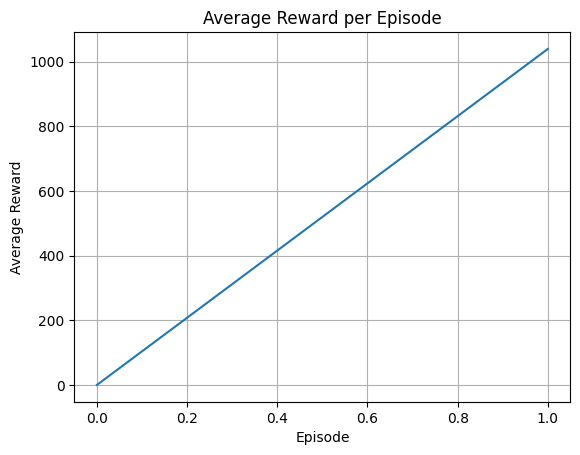

 10%|█         | 10001/100000 [41:36<1099:02:47, 43.96s/it]

Episode 10000, Epsilon 0.0100



 11%|█         | 11001/100000 [45:23<6:22:24,  3.88it/s]

State saved to uav_location_aware_training_state.pkl
Episode 11000, Epsilon 0.0100



 12%|█▏        | 12001/100000 [49:07<6:03:37,  4.03it/s]

State saved to uav_location_aware_training_state.pkl
Episode 12000, Epsilon 0.0100



 13%|█▎        | 13001/100000 [52:51<6:46:56,  3.56it/s]

State saved to uav_location_aware_training_state.pkl
Episode 13000, Epsilon 0.0100



 14%|█▍        | 14001/100000 [56:34<5:57:31,  4.01it/s]

State saved to uav_location_aware_training_state.pkl
Episode 14000, Epsilon 0.0100



 15%|█▌        | 15001/100000 [1:00:18<5:38:09,  4.19it/s]

State saved to uav_location_aware_training_state.pkl
Episode 15000, Epsilon 0.0100



 16%|█▌        | 16001/100000 [1:04:01<5:25:42,  4.30it/s]

State saved to uav_location_aware_training_state.pkl
Episode 16000, Epsilon 0.0100



 17%|█▋        | 17001/100000 [1:07:44<5:28:34,  4.21it/s]

State saved to uav_location_aware_training_state.pkl
Episode 17000, Epsilon 0.0100



 18%|█▊        | 18001/100000 [1:11:28<6:12:20,  3.67it/s]

State saved to uav_location_aware_training_state.pkl
Episode 18000, Epsilon 0.0100



 19%|█▉        | 19001/100000 [1:15:11<5:36:50,  4.01it/s]

State saved to uav_location_aware_training_state.pkl
Episode 19000, Epsilon 0.0100



 20%|██        | 20000/100000 [1:18:53<4:59:40,  4.45it/s]

Episode 20001/100000 - Average Reward: 2119.79



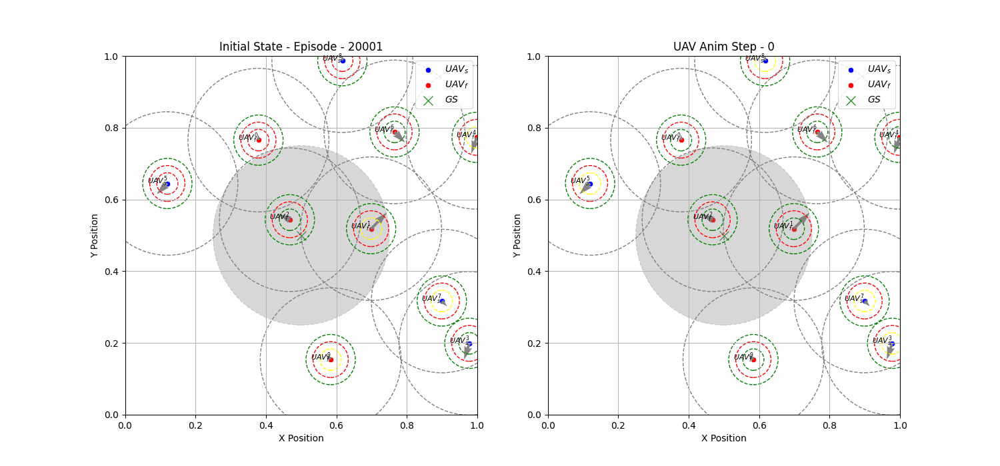


Q-Table:

[[ 7278349.41042077  6756594.13381829 48375376.57142574 ...
   4790739.69337871  4588940.96898308  9562855.8222779 ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [  747494.09218242   945061.79612933 48539660.45765871 ...
    730077.37398858  2864972.80653029   942187.2794362 ]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[48456510.64256215        0.         48539660.45765871 ...
        0.                0.                0.        ]


Policy:
[3 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


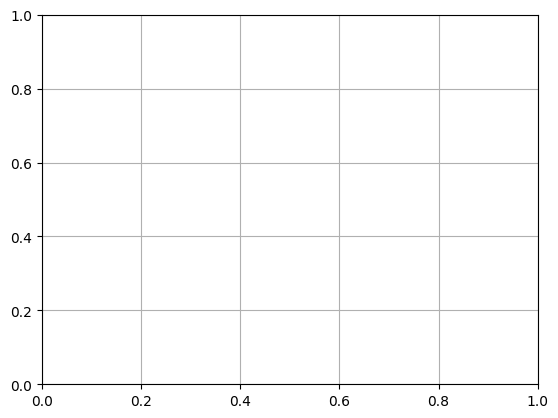

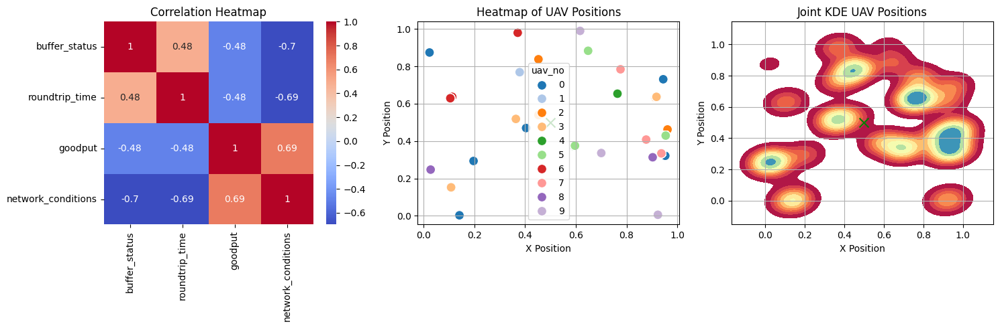

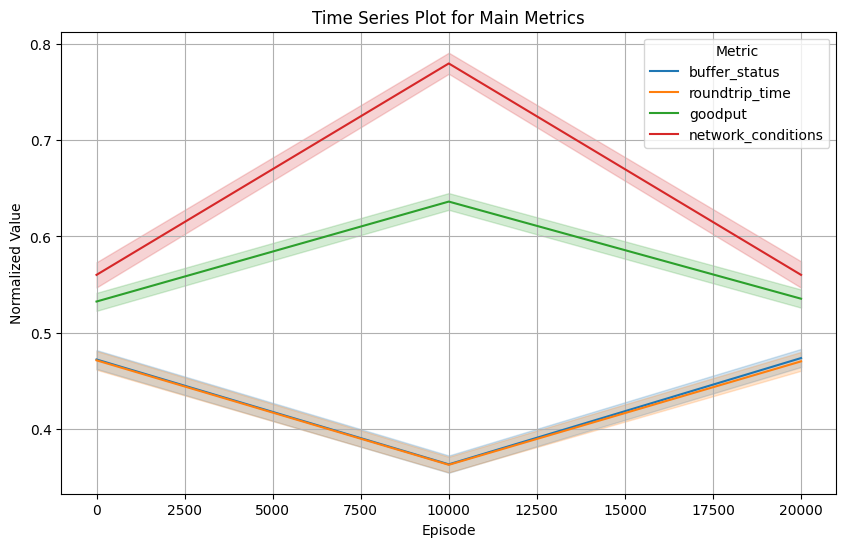

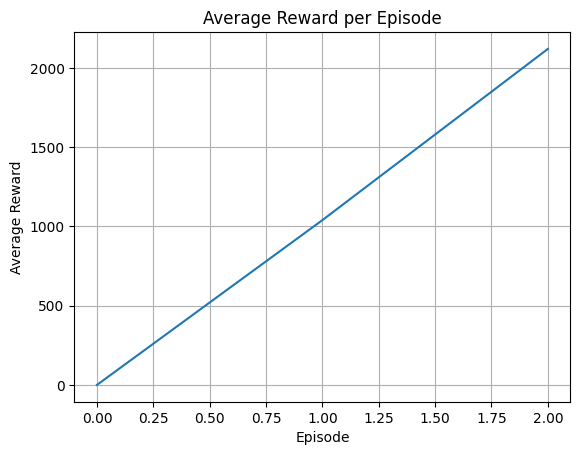

 20%|██        | 20001/100000 [1:21:22<993:00:59, 44.69s/it]

Episode 20000, Epsilon 0.0100



 21%|██        | 21002/100000 [1:25:05<5:35:34,  3.92it/s]

State saved to uav_location_aware_training_state.pkl
Episode 21000, Epsilon 0.0100



 22%|██▏       | 22001/100000 [1:28:47<5:28:23,  3.96it/s]

State saved to uav_location_aware_training_state.pkl
Episode 22000, Epsilon 0.0100



 23%|██▎       | 23001/100000 [1:32:28<5:21:03,  4.00it/s]

State saved to uav_location_aware_training_state.pkl
Episode 23000, Epsilon 0.0100



 24%|██▍       | 24001/100000 [1:36:10<5:13:39,  4.04it/s]

State saved to uav_location_aware_training_state.pkl
Episode 24000, Epsilon 0.0100



 25%|██▌       | 25001/100000 [1:39:51<4:59:46,  4.17it/s]

State saved to uav_location_aware_training_state.pkl
Episode 25000, Epsilon 0.0100



 26%|██▌       | 26001/100000 [1:43:33<5:01:08,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 26000, Epsilon 0.0100



 27%|██▋       | 27001/100000 [1:47:15<4:48:47,  4.21it/s]

State saved to uav_location_aware_training_state.pkl
Episode 27000, Epsilon 0.0100



 28%|██▊       | 28001/100000 [1:50:56<4:51:49,  4.11it/s]

State saved to uav_location_aware_training_state.pkl
Episode 28000, Epsilon 0.0100



 29%|██▉       | 29002/100000 [1:54:39<4:49:40,  4.08it/s]

State saved to uav_location_aware_training_state.pkl
Episode 29000, Epsilon 0.0100



 30%|███       | 30000/100000 [1:58:20<4:02:27,  4.81it/s]

Episode 30001/100000 - Average Reward: 2943.92



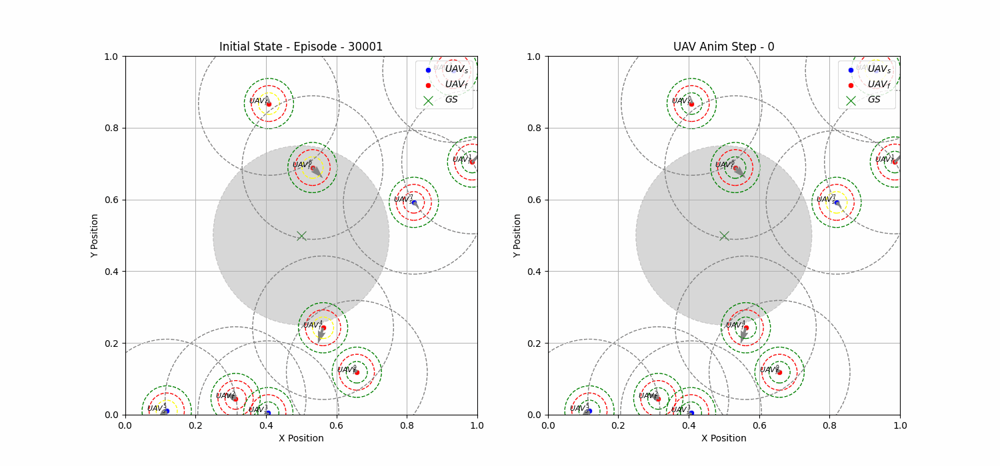


Q-Table:

[[ 8410932.01545109  7034358.94037984 31137985.1944217  ...
   5706663.59908005  6139260.56995278 10068346.35019161]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 1469203.29153587   945061.79612933 39263702.88866823 ...
    730077.37398858  3258540.30480672  1944099.51027561]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[31148640.80465731        0.         39263702.88866823 ...
        0.                0.                0.        ]


Policy:
[3 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


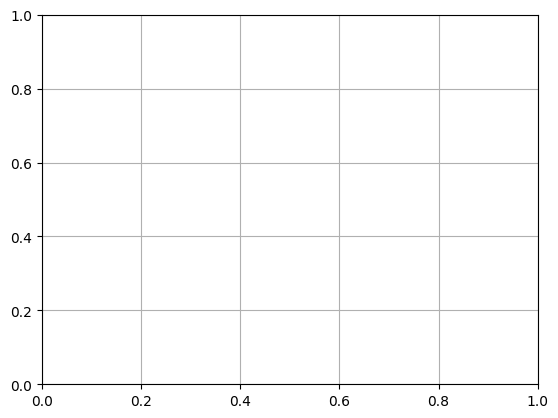

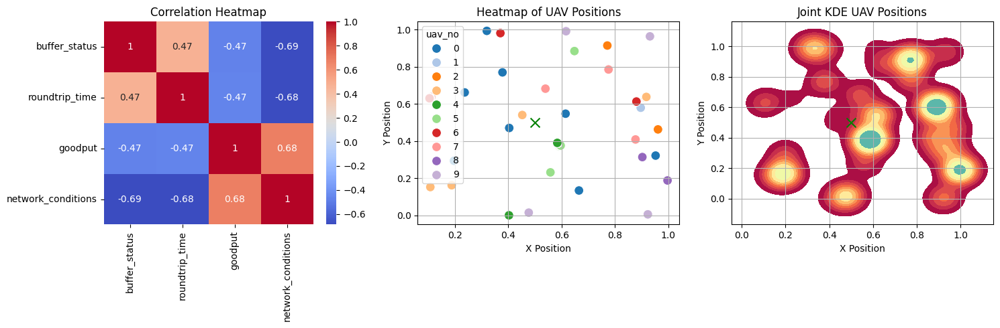

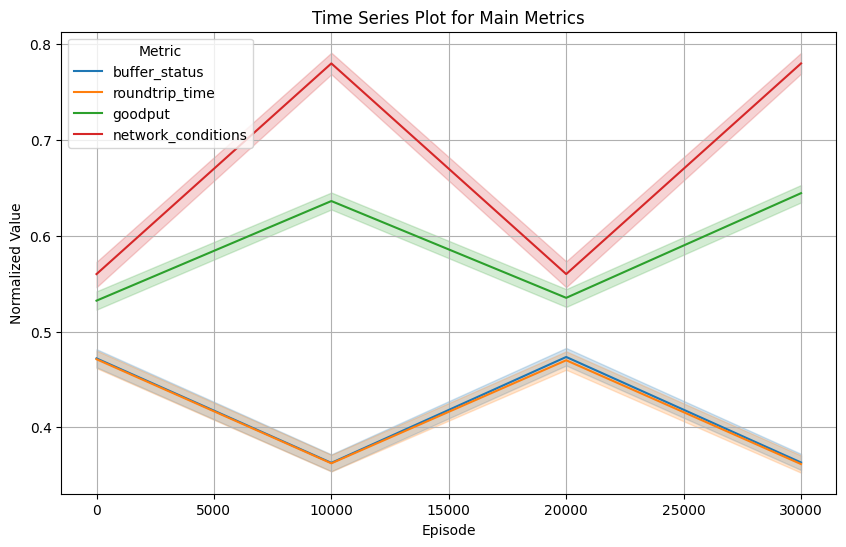

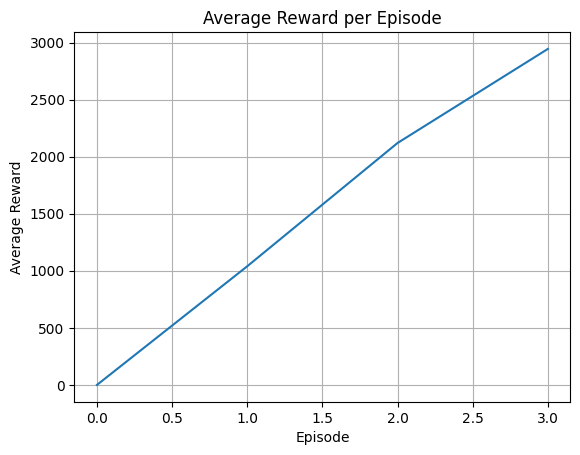

 30%|███       | 30001/100000 [2:00:55<906:05:48, 46.60s/it]

Episode 30000, Epsilon 0.0100



 31%|███       | 31001/100000 [2:04:39<4:44:36,  4.04it/s]

State saved to uav_location_aware_training_state.pkl
Episode 31000, Epsilon 0.0100



 32%|███▏      | 32001/100000 [2:08:21<4:30:12,  4.19it/s]

State saved to uav_location_aware_training_state.pkl
Episode 32000, Epsilon 0.0100



 33%|███▎      | 33001/100000 [2:11:59<4:21:28,  4.27it/s]

State saved to uav_location_aware_training_state.pkl
Episode 33000, Epsilon 0.0100



 34%|███▍      | 34001/100000 [2:15:34<4:28:56,  4.09it/s]

State saved to uav_location_aware_training_state.pkl
Episode 34000, Epsilon 0.0100



 35%|███▌      | 35001/100000 [2:19:10<4:19:36,  4.17it/s]

State saved to uav_location_aware_training_state.pkl
Episode 35000, Epsilon 0.0100



 36%|███▌      | 36002/100000 [2:22:44<4:10:27,  4.26it/s]

State saved to uav_location_aware_training_state.pkl
Episode 36000, Epsilon 0.0100



 37%|███▋      | 37001/100000 [2:26:17<4:37:38,  3.78it/s]

State saved to uav_location_aware_training_state.pkl
Episode 37000, Epsilon 0.0100



 38%|███▊      | 38002/100000 [2:29:52<4:00:10,  4.30it/s]

State saved to uav_location_aware_training_state.pkl
Episode 38000, Epsilon 0.0100



 39%|███▉      | 39001/100000 [2:33:29<4:45:33,  3.56it/s]

State saved to uav_location_aware_training_state.pkl
Episode 39000, Epsilon 0.0100



 40%|████      | 40000/100000 [2:37:06<3:39:08,  4.56it/s]

Episode 40001/100000 - Average Reward: 4064.8



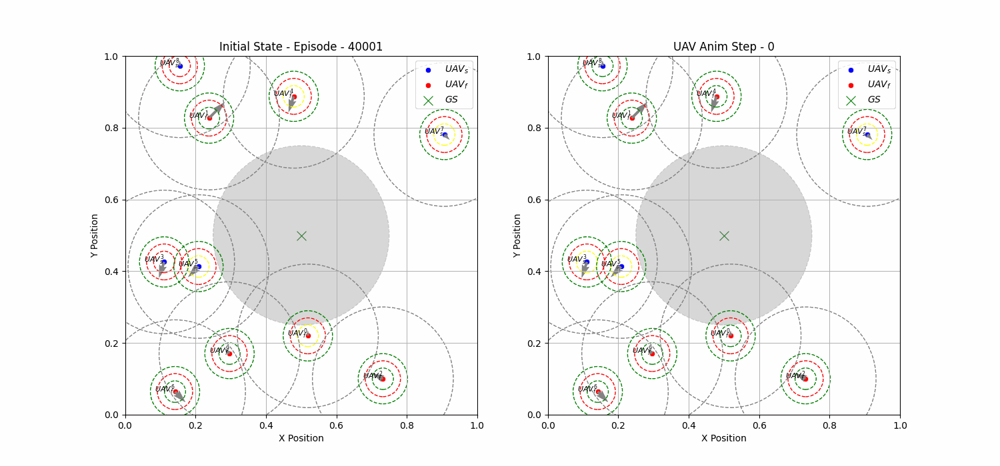


Q-Table:

[[ 8785924.82667321  8057490.17938516 28524881.76460791 ...
   7175162.62459548  6566958.46870621 11075100.81997599]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 2253248.00473146  1194784.80668017 27725729.81933098 ...
    730077.37398858  3258540.30480672  2447610.27631352]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[28524881.76460791        0.         27727344.03531615 ...
        0.                0.                0.        ]


Policy:
[2 0 3 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


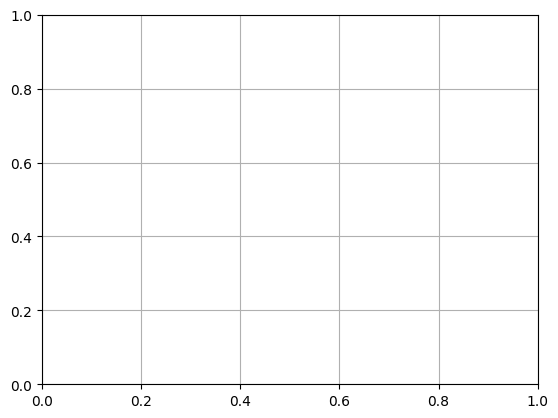

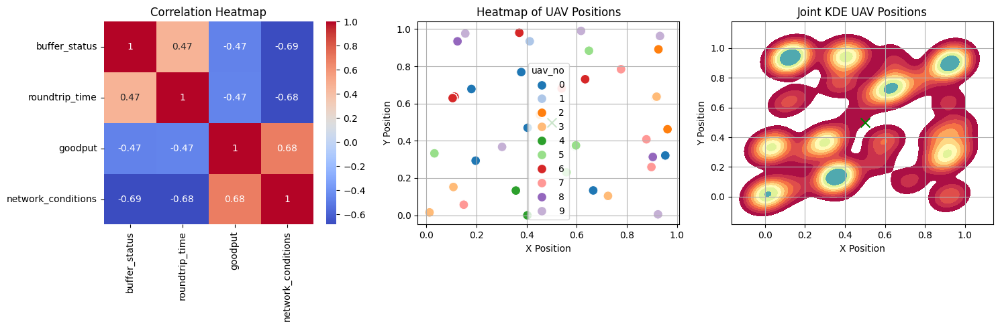

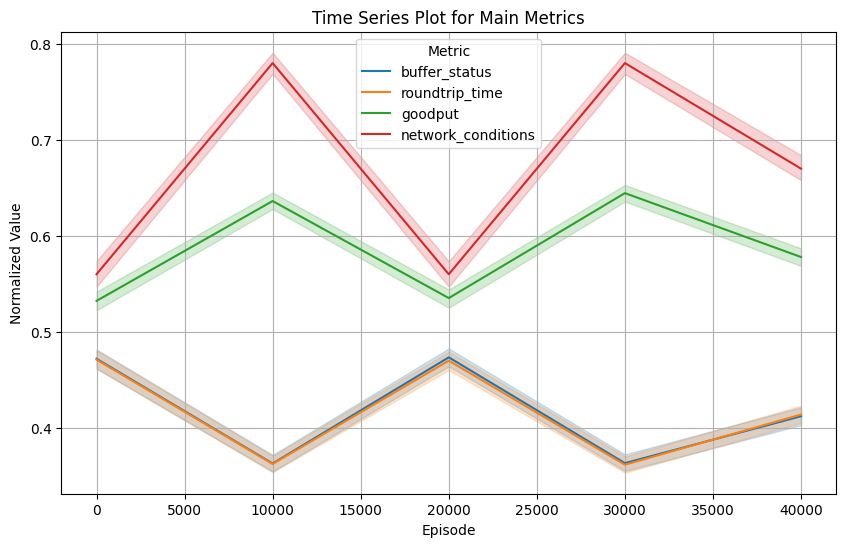

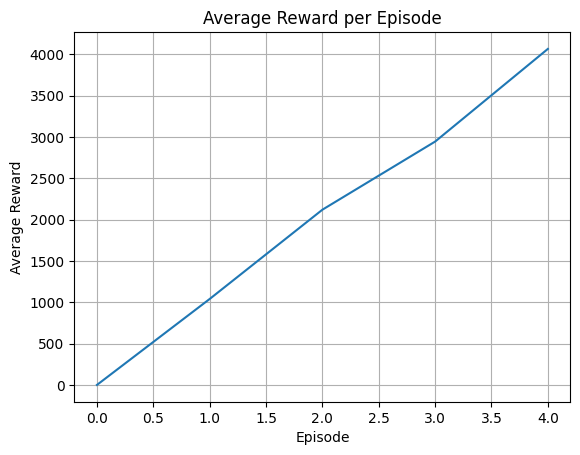

 40%|████      | 40001/100000 [2:39:41<775:55:59, 46.56s/it]

Episode 40000, Epsilon 0.0100



 41%|████      | 41002/100000 [2:43:14<3:39:52,  4.47it/s]

State saved to uav_location_aware_training_state.pkl
Episode 41000, Epsilon 0.0100



 42%|████▏     | 42001/100000 [2:46:48<3:55:39,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 42000, Epsilon 0.0100



 43%|████▎     | 43001/100000 [2:50:22<4:02:54,  3.91it/s]

State saved to uav_location_aware_training_state.pkl
Episode 43000, Epsilon 0.0100



 44%|████▍     | 44001/100000 [2:53:57<3:45:46,  4.13it/s]

State saved to uav_location_aware_training_state.pkl
Episode 44000, Epsilon 0.0100



 45%|████▌     | 45001/100000 [2:57:37<3:37:16,  4.22it/s]

State saved to uav_location_aware_training_state.pkl
Episode 45000, Epsilon 0.0100



 46%|████▌     | 46001/100000 [3:01:18<3:32:36,  4.23it/s]

State saved to uav_location_aware_training_state.pkl
Episode 46000, Epsilon 0.0100



 47%|████▋     | 47001/100000 [3:04:59<4:16:37,  3.44it/s]

State saved to uav_location_aware_training_state.pkl
Episode 47000, Epsilon 0.0100



 48%|████▊     | 48001/100000 [3:08:40<3:52:50,  3.72it/s]

State saved to uav_location_aware_training_state.pkl
Episode 48000, Epsilon 0.0100



 49%|████▉     | 49001/100000 [3:12:17<3:40:28,  3.86it/s]

State saved to uav_location_aware_training_state.pkl
Episode 49000, Epsilon 0.0100



 50%|█████     | 50000/100000 [3:15:56<2:57:42,  4.69it/s]

Episode 50001/100000 - Average Reward: 4965.66



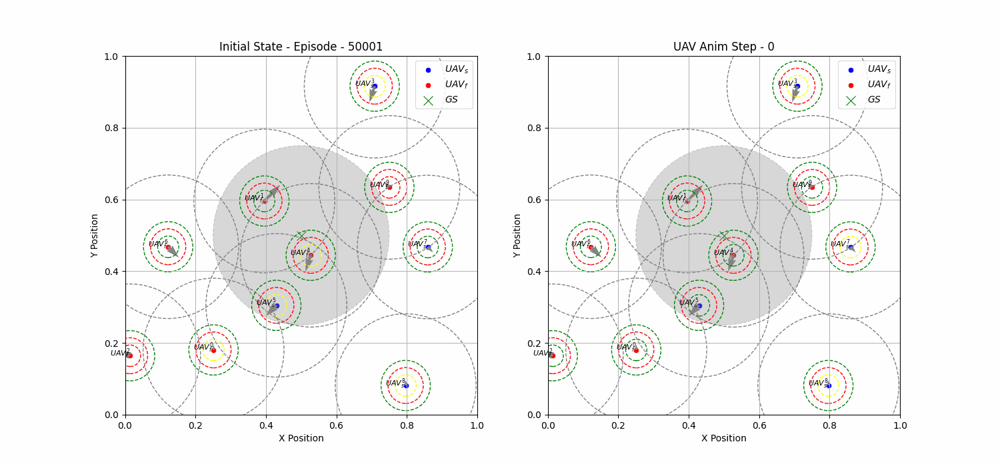


Q-Table:

[[ 9495189.57008882  8524073.5128986  18226989.97565391 ...
   7457838.81406157  6902378.32906233 11395651.04213277]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 2397676.00953342  1352197.63346755 20413913.00897346 ...
    922406.13945671  3258540.30480672  2797861.18796296]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[18226989.97565391        0.         20413913.00897346 ...
        0.                0.                0.        ]


Policy:
[2 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


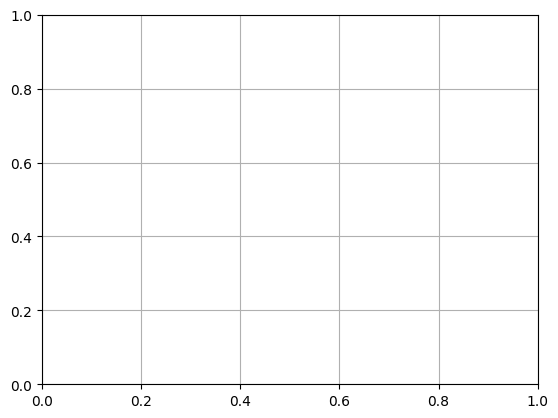

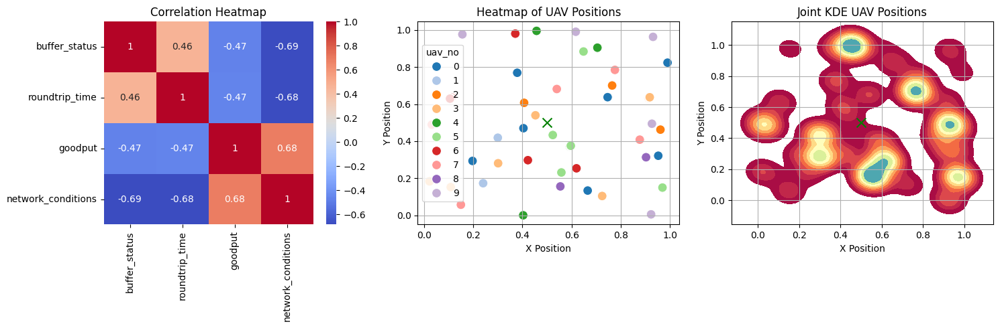

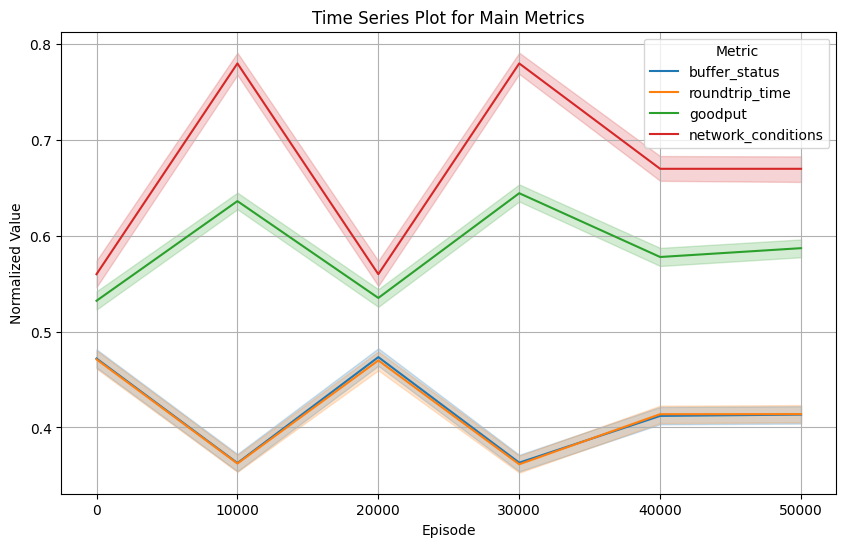

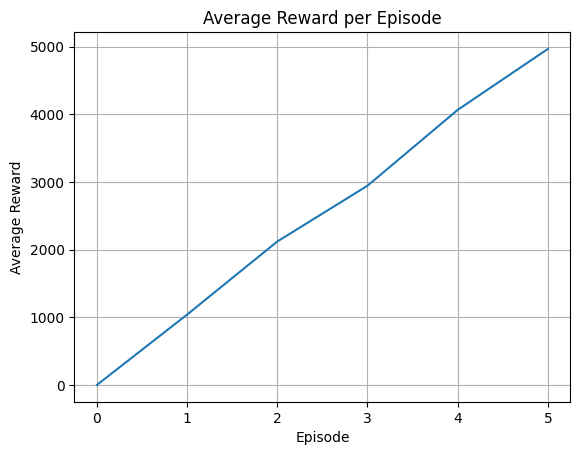

 50%|█████     | 50002/100000 [3:18:34<462:26:27, 33.30s/it]

Episode 50000, Epsilon 0.0100



 51%|█████     | 51001/100000 [3:22:16<3:19:16,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 51000, Epsilon 0.0100



 52%|█████▏    | 52001/100000 [3:25:59<3:16:16,  4.08it/s]

State saved to uav_location_aware_training_state.pkl
Episode 52000, Epsilon 0.0100



 53%|█████▎    | 53001/100000 [3:29:40<3:06:46,  4.19it/s]

State saved to uav_location_aware_training_state.pkl
Episode 53000, Epsilon 0.0100



 54%|█████▍    | 54001/100000 [3:33:21<3:15:38,  3.92it/s]

State saved to uav_location_aware_training_state.pkl
Episode 54000, Epsilon 0.0100



 55%|█████▌    | 55001/100000 [3:37:02<3:22:20,  3.71it/s]

State saved to uav_location_aware_training_state.pkl
Episode 55000, Epsilon 0.0100



 56%|█████▌    | 56001/100000 [3:40:47<2:57:15,  4.14it/s]

State saved to uav_location_aware_training_state.pkl
Episode 56000, Epsilon 0.0100



 57%|█████▋    | 57001/100000 [3:44:30<2:48:52,  4.24it/s]

State saved to uav_location_aware_training_state.pkl
Episode 57000, Epsilon 0.0100



 58%|█████▊    | 58001/100000 [3:48:12<2:57:47,  3.94it/s]

State saved to uav_location_aware_training_state.pkl
Episode 58000, Epsilon 0.0100



 59%|█████▉    | 59001/100000 [3:51:54<2:49:26,  4.03it/s]

State saved to uav_location_aware_training_state.pkl
Episode 59000, Epsilon 0.0100



 60%|██████    | 60000/100000 [3:55:35<2:20:44,  4.74it/s]

Episode 60001/100000 - Average Reward: 5945.67



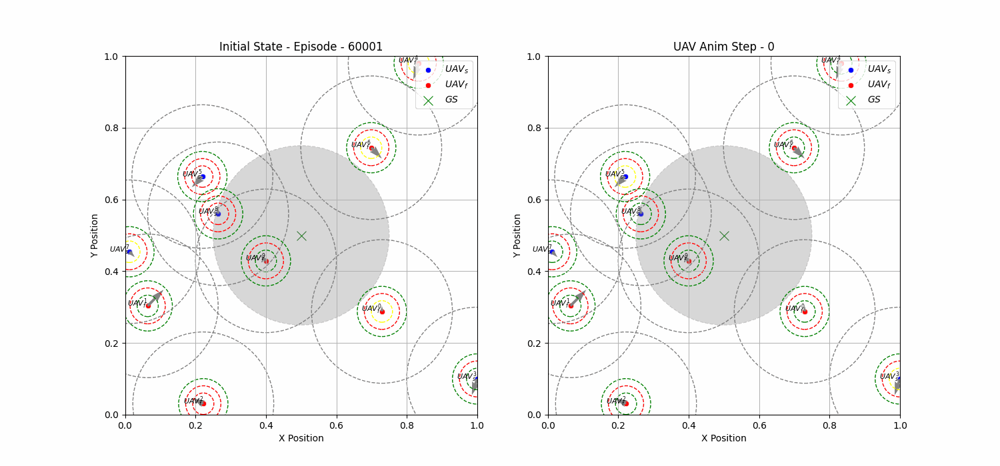


Q-Table:

[[ 9843951.22049834  9631125.36132283 28621723.72569483 ...
   8680864.91229682  7492893.0863575  12039147.32569096]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 2595548.57923185  1498883.34631146 24480106.70457634 ...
    922406.13945671  3258540.30480672  2797861.18796296]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[31369673.15300786        0.         26440930.68737653 ...
        0.                0.                0.        ]


Policy:
[3 0 3 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


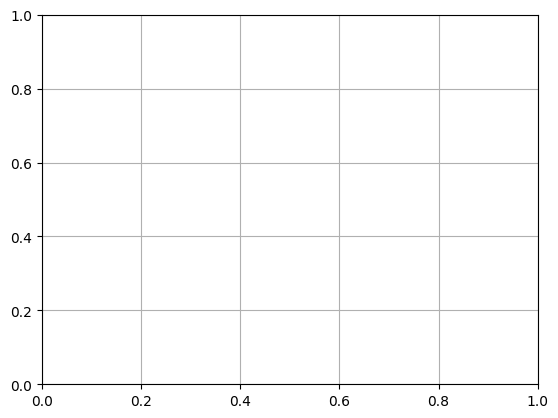

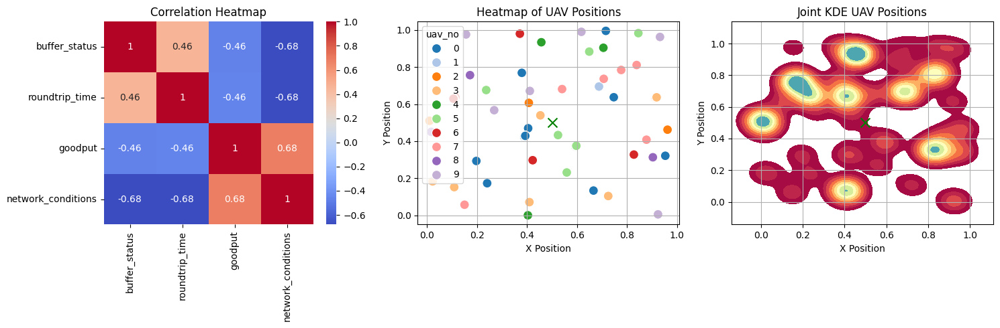

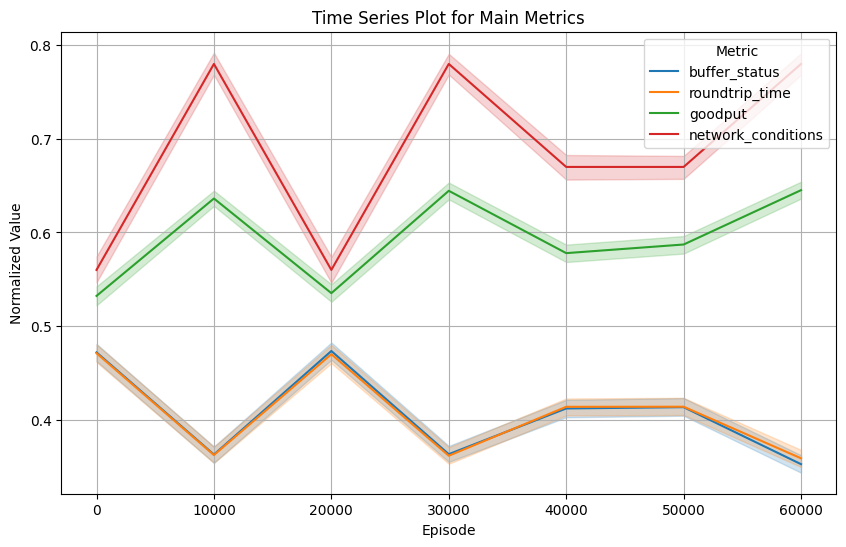

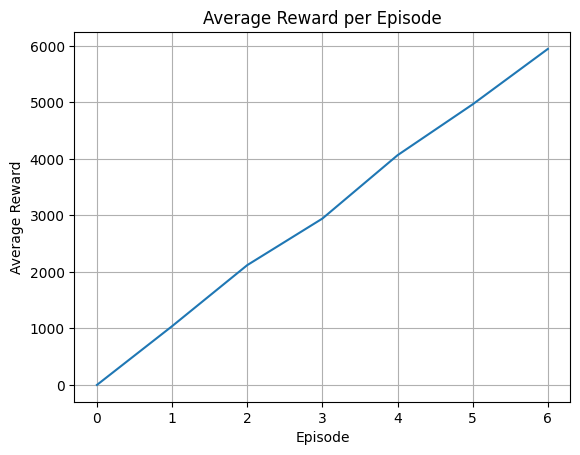

 60%|██████    | 60001/100000 [3:58:20<550:35:32, 49.55s/it]

Episode 60000, Epsilon 0.0100



 61%|██████    | 61001/100000 [4:02:02<2:47:05,  3.89it/s]

State saved to uav_location_aware_training_state.pkl
Episode 61000, Epsilon 0.0100



 62%|██████▏   | 62001/100000 [4:05:45<2:43:36,  3.87it/s]

State saved to uav_location_aware_training_state.pkl
Episode 62000, Epsilon 0.0100



 63%|██████▎   | 63001/100000 [4:09:26<2:38:54,  3.88it/s]

State saved to uav_location_aware_training_state.pkl
Episode 63000, Epsilon 0.0100



 64%|██████▍   | 64001/100000 [4:13:09<2:21:21,  4.24it/s]

State saved to uav_location_aware_training_state.pkl
Episode 64000, Epsilon 0.0100



 65%|██████▌   | 65001/100000 [4:16:54<2:23:17,  4.07it/s]

State saved to uav_location_aware_training_state.pkl
Episode 65000, Epsilon 0.0100



 66%|██████▌   | 66001/100000 [4:20:35<2:18:18,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 66000, Epsilon 0.0100



 67%|██████▋   | 67001/100000 [4:24:12<2:08:46,  4.27it/s]

State saved to uav_location_aware_training_state.pkl
Episode 67000, Epsilon 0.0100



 68%|██████▊   | 68001/100000 [4:27:50<2:09:18,  4.12it/s]

State saved to uav_location_aware_training_state.pkl
Episode 68000, Epsilon 0.0100



 69%|██████▉   | 69002/100000 [4:31:26<1:56:02,  4.45it/s]

State saved to uav_location_aware_training_state.pkl
Episode 69000, Epsilon 0.0100



 70%|███████   | 70000/100000 [4:35:02<1:47:01,  4.67it/s]

Episode 70001/100000 - Average Reward: 7062.58



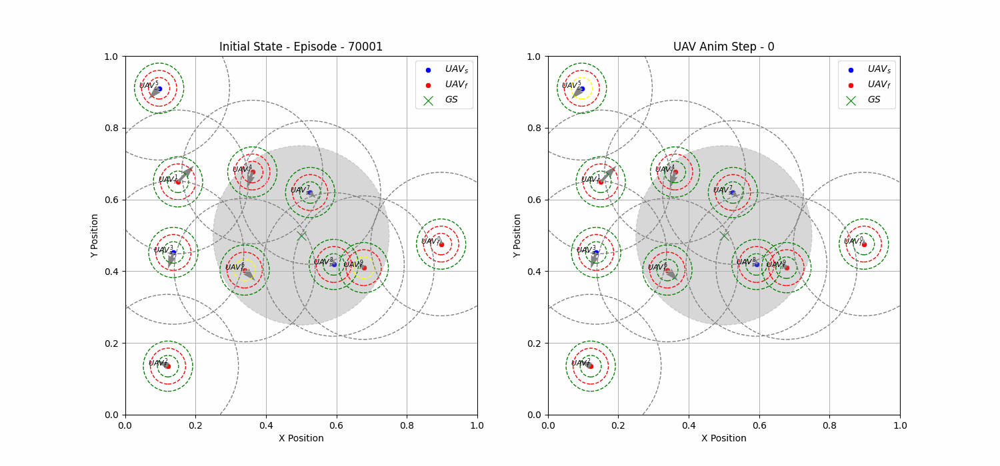


Q-Table:

[[10569774.73822969  9994498.76966109 34625584.05125978 ...
   9005752.32597385  7988157.89419141 12455441.34419668]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 2595548.57923185  1498883.34631146 33904090.41997461 ...
   1141769.62743043  3258540.30480672  2797861.18796296]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[34625584.05125978        0.         33904090.41997461 ...
        0.                0.                0.        ]


Policy:
[2 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


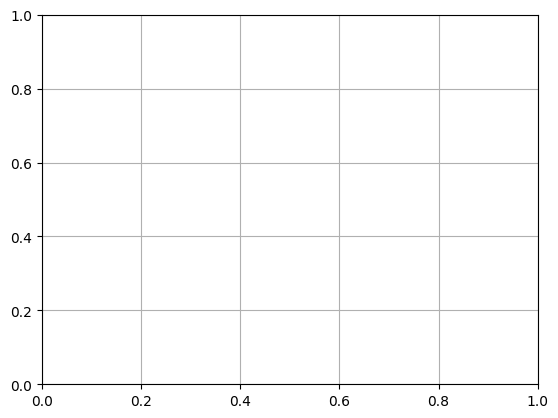

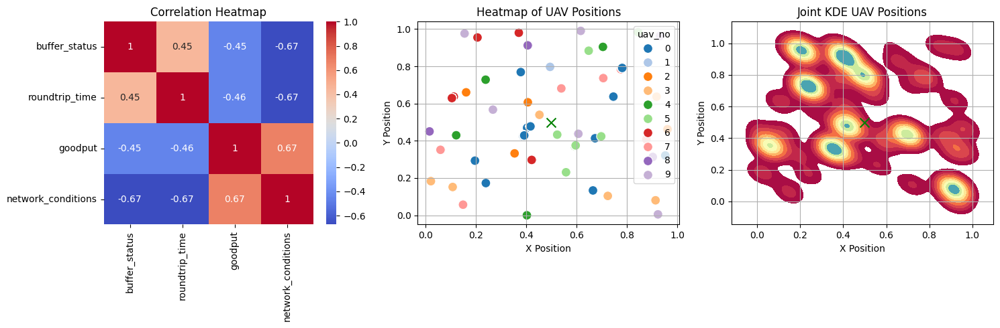

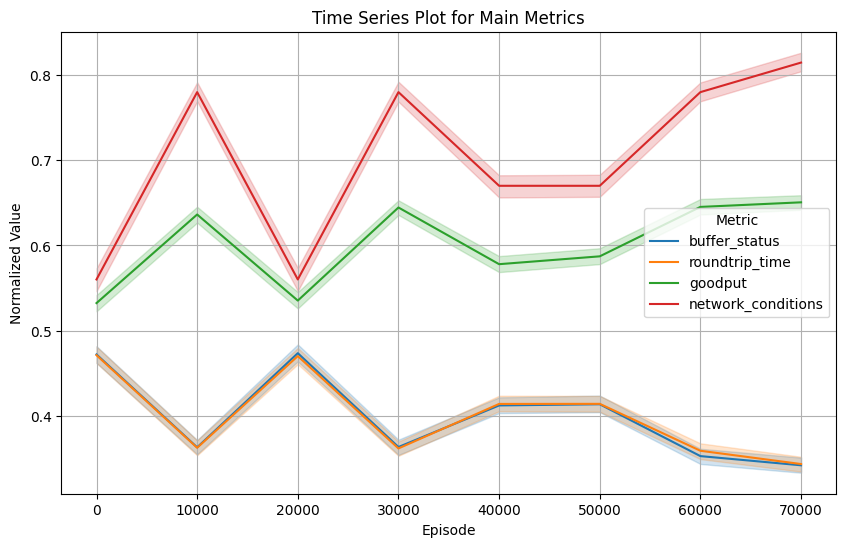

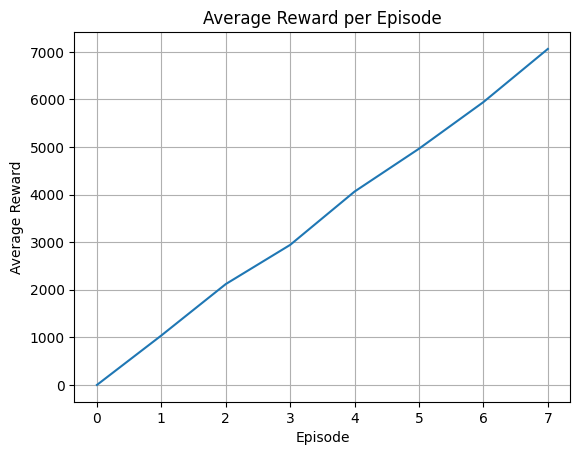

 70%|███████   | 70002/100000 [4:37:53<300:14:04, 36.03s/it]

Episode 70000, Epsilon 0.0100



 71%|███████   | 71002/100000 [4:41:29<1:50:27,  4.38it/s]

State saved to uav_location_aware_training_state.pkl
Episode 71000, Epsilon 0.0100



 72%|███████▏  | 72001/100000 [4:45:13<1:50:01,  4.24it/s]

State saved to uav_location_aware_training_state.pkl
Episode 72000, Epsilon 0.0100



 73%|███████▎  | 73001/100000 [4:48:56<1:47:48,  4.17it/s]

State saved to uav_location_aware_training_state.pkl
Episode 73000, Epsilon 0.0100



 74%|███████▍  | 74001/100000 [4:52:39<1:54:13,  3.79it/s]

State saved to uav_location_aware_training_state.pkl
Episode 74000, Epsilon 0.0100



 75%|███████▌  | 75001/100000 [4:56:22<1:41:42,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 75000, Epsilon 0.0100



 76%|███████▌  | 76001/100000 [5:00:00<1:36:43,  4.14it/s]

State saved to uav_location_aware_training_state.pkl
Episode 76000, Epsilon 0.0100



 77%|███████▋  | 77001/100000 [5:03:36<1:32:05,  4.16it/s]

State saved to uav_location_aware_training_state.pkl
Episode 77000, Epsilon 0.0100



 78%|███████▊  | 78002/100000 [5:07:13<1:22:46,  4.43it/s]

State saved to uav_location_aware_training_state.pkl
Episode 78000, Epsilon 0.0100



 79%|███████▉  | 79001/100000 [5:10:50<1:20:59,  4.32it/s]

State saved to uav_location_aware_training_state.pkl
Episode 79000, Epsilon 0.0100



 80%|████████  | 80000/100000 [5:14:25<1:07:31,  4.94it/s]

Episode 80001/100000 - Average Reward: 8362.84



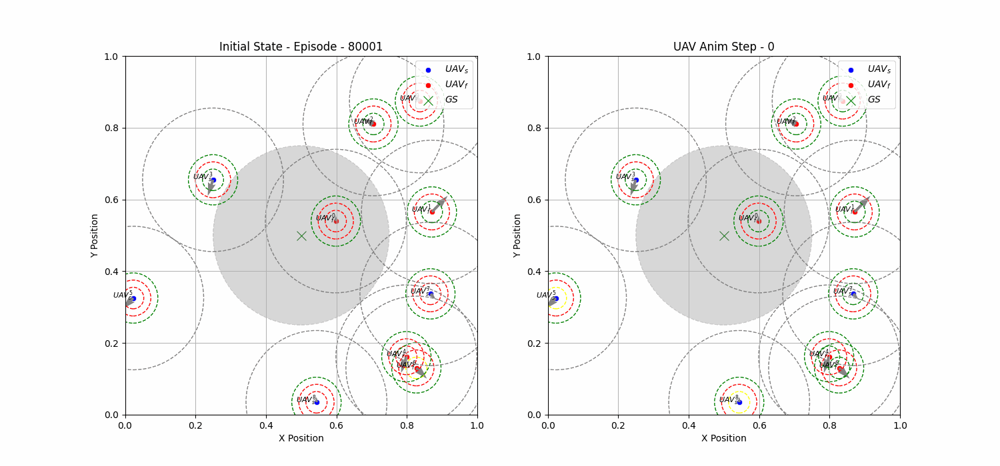


Q-Table:

[[11195755.10282788 10479604.82024263 29570951.81539752 ...
   9402154.22302418  8944758.76266539 13930608.09212905]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 2834931.65660392  1751277.61597986 26958086.62424531 ...
   1141769.62743043  3258540.30480672  3083957.17861224]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[29637240.44758933        0.         26958086.62424531 ...
        0.                0.                0.        ]


Policy:
[3 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


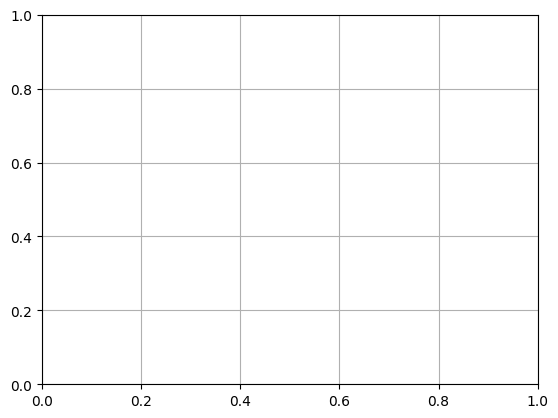

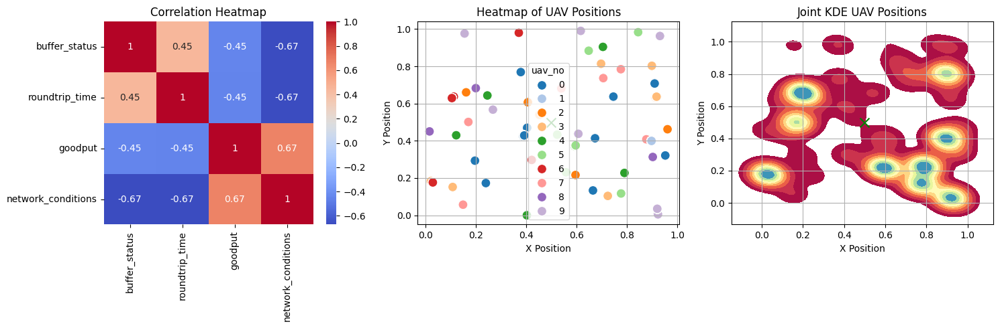

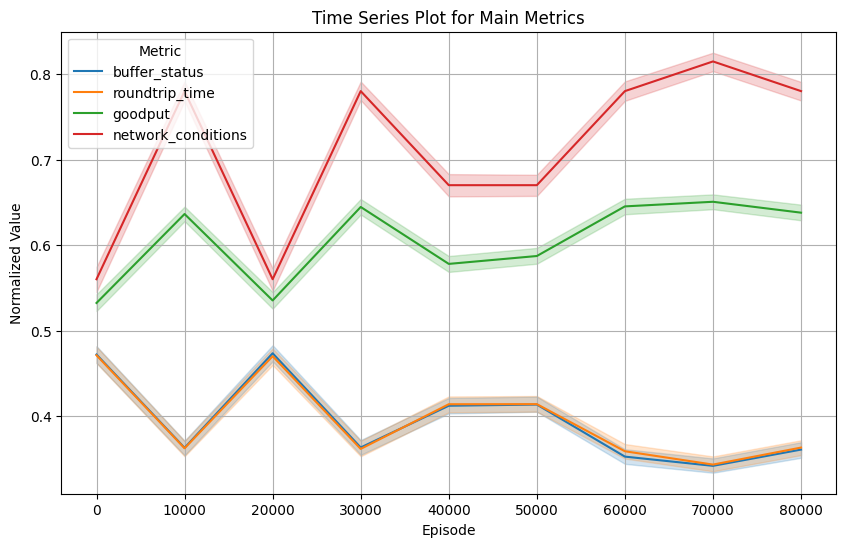

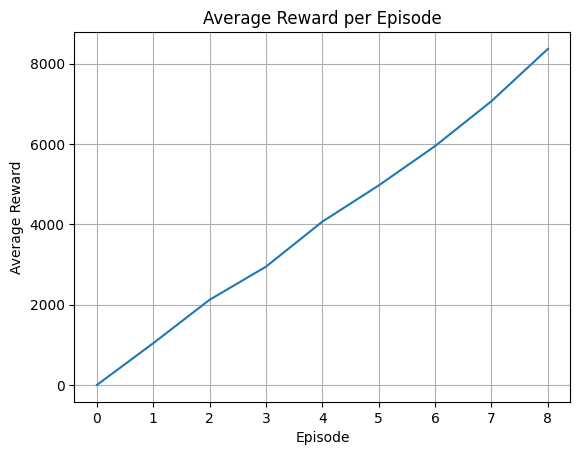

 80%|████████  | 80002/100000 [5:17:12<195:17:21, 35.16s/it]

Episode 80000, Epsilon 0.0100



 81%|████████  | 81001/100000 [5:20:46<1:17:52,  4.07it/s]

State saved to uav_location_aware_training_state.pkl
Episode 81000, Epsilon 0.0100



 82%|████████▏ | 82002/100000 [5:24:22<1:07:44,  4.43it/s]

State saved to uav_location_aware_training_state.pkl
Episode 82000, Epsilon 0.0100



 83%|████████▎ | 83001/100000 [5:27:56<1:05:47,  4.31it/s]

State saved to uav_location_aware_training_state.pkl
Episode 83000, Epsilon 0.0100



 84%|████████▍ | 84002/100000 [5:31:32<59:42,  4.47it/s]  

State saved to uav_location_aware_training_state.pkl
Episode 84000, Epsilon 0.0100



 85%|████████▌ | 85001/100000 [5:35:08<58:50,  4.25it/s]

State saved to uav_location_aware_training_state.pkl
Episode 85000, Epsilon 0.0100



 86%|████████▌ | 86002/100000 [5:38:45<53:13,  4.38it/s]

State saved to uav_location_aware_training_state.pkl
Episode 86000, Epsilon 0.0100



 87%|████████▋ | 87001/100000 [5:42:18<51:25,  4.21it/s]

State saved to uav_location_aware_training_state.pkl
Episode 87000, Epsilon 0.0100



 88%|████████▊ | 88001/100000 [5:45:51<46:42,  4.28it/s]

State saved to uav_location_aware_training_state.pkl
Episode 88000, Epsilon 0.0100



 89%|████████▉ | 89001/100000 [5:49:26<43:19,  4.23it/s]

State saved to uav_location_aware_training_state.pkl
Episode 89000, Epsilon 0.0100



 90%|█████████ | 90000/100000 [5:53:01<33:30,  4.97it/s]

Episode 90001/100000 - Average Reward: 9447.76



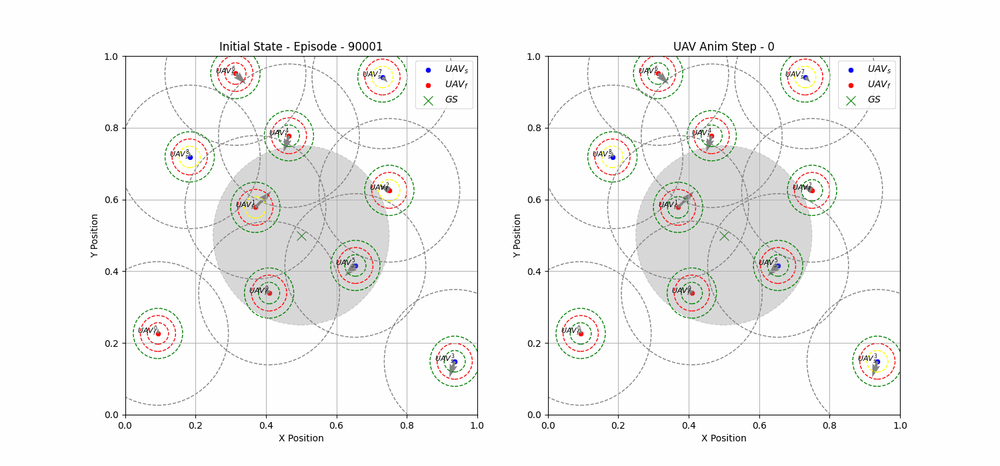


Q-Table:

[[11663889.88077534 10734452.04404984 25599133.60417702 ...
  10028290.67622789  9819575.01555932 14431979.85997456]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [ 3053863.61283745  1751277.61597986 29277767.94790243 ...
   1141769.62743043  3479526.94576727  3467496.62187799]
 ...
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]
 [       0.                0.                0.         ...
         0.                0.                0.        ]]

V-Table (State Values):

[25599133.60417702        0.         29277767.94790243 ...
        0.                0.                0.        ]


Policy:
[2 0 2 ... 0 0 0]


State saved to uav_location_aware_training_state.pkl


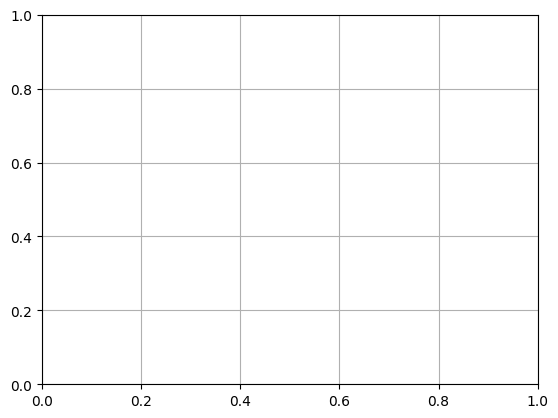

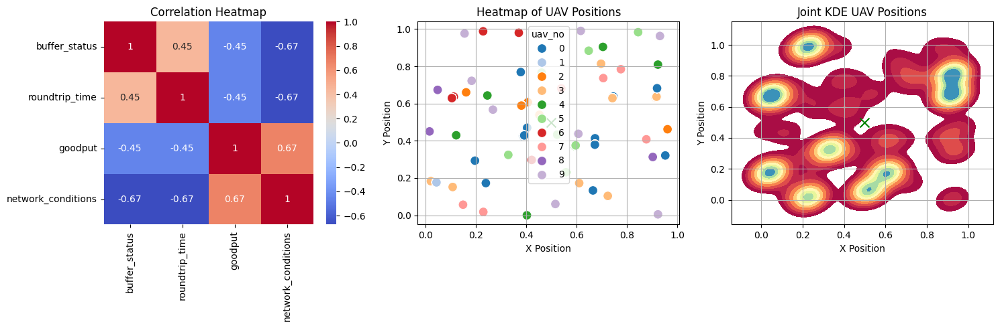

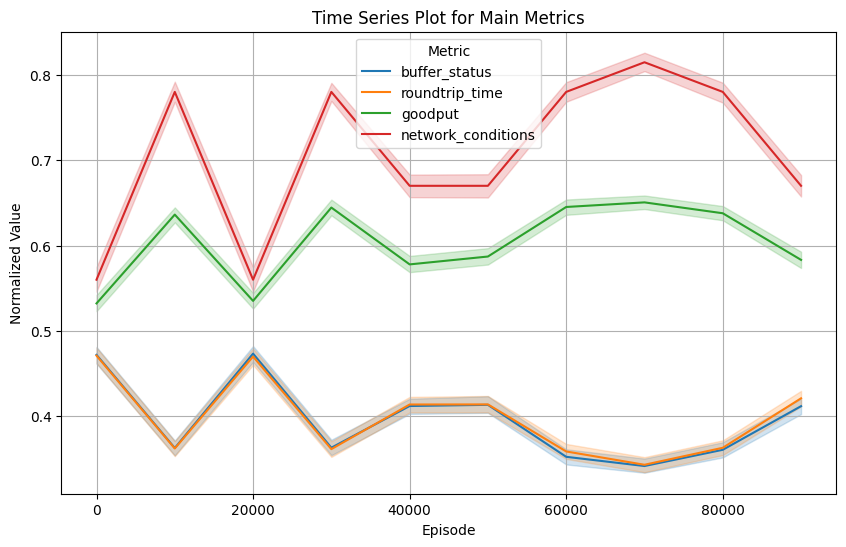

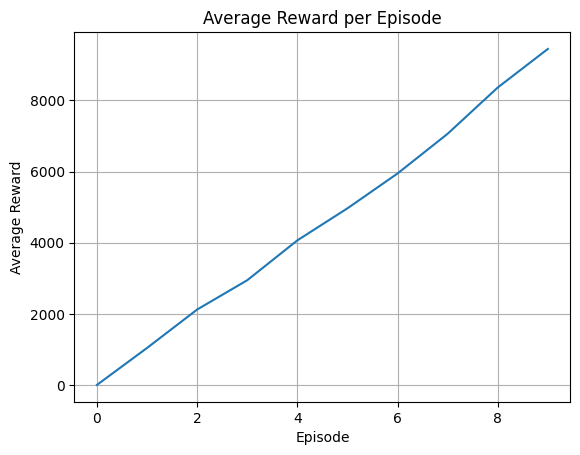

 90%|█████████ | 90001/100000 [5:55:55<145:42:44, 52.46s/it]

Episode 90000, Epsilon 0.0100



 91%|█████████ | 91001/100000 [5:59:35<36:34,  4.10it/s]

State saved to uav_location_aware_training_state.pkl
Episode 91000, Epsilon 0.0100



 92%|█████████▏| 92001/100000 [6:03:20<37:05,  3.59it/s]

State saved to uav_location_aware_training_state.pkl
Episode 92000, Epsilon 0.0100



 93%|█████████▎| 93001/100000 [6:07:05<31:26,  3.71it/s]

State saved to uav_location_aware_training_state.pkl
Episode 93000, Epsilon 0.0100



 94%|█████████▍| 94002/100000 [6:10:51<23:43,  4.21it/s]

State saved to uav_location_aware_training_state.pkl
Episode 94000, Epsilon 0.0100



 95%|█████████▌| 95001/100000 [6:14:35<20:16,  4.11it/s]

State saved to uav_location_aware_training_state.pkl
Episode 95000, Epsilon 0.0100



 96%|█████████▌| 96001/100000 [6:18:22<16:32,  4.03it/s]

State saved to uav_location_aware_training_state.pkl
Episode 96000, Epsilon 0.0100



 97%|█████████▋| 97001/100000 [6:22:07<13:13,  3.78it/s]

State saved to uav_location_aware_training_state.pkl
Episode 97000, Epsilon 0.0100



 98%|█████████▊| 98001/100000 [6:25:43<08:25,  3.96it/s]

State saved to uav_location_aware_training_state.pkl
Episode 98000, Epsilon 0.0100



 99%|█████████▉| 99001/100000 [6:29:19<04:15,  3.91it/s]

State saved to uav_location_aware_training_state.pkl
Episode 99000, Epsilon 0.0100



100%|██████████| 100000/100000 [6:32:55<00:00,  4.24it/s]


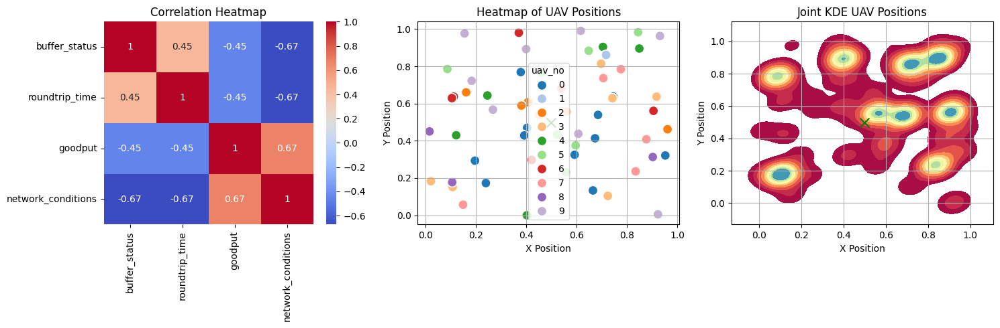

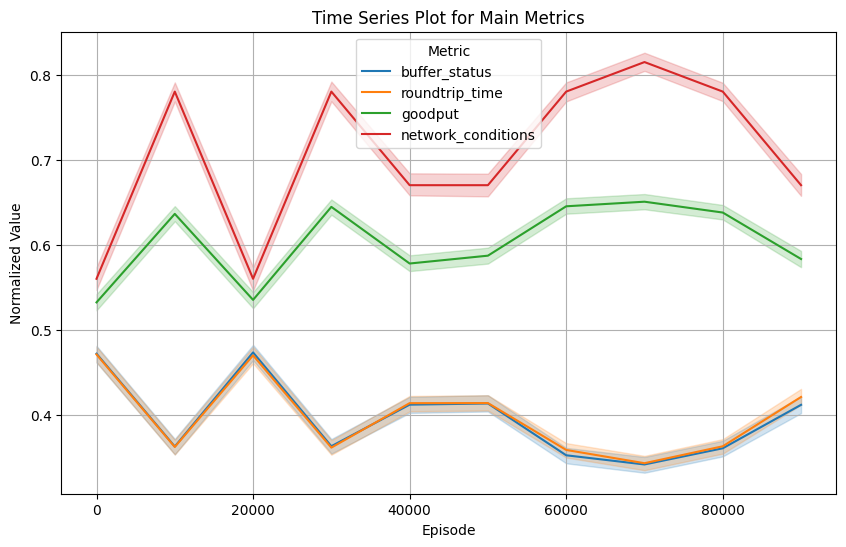

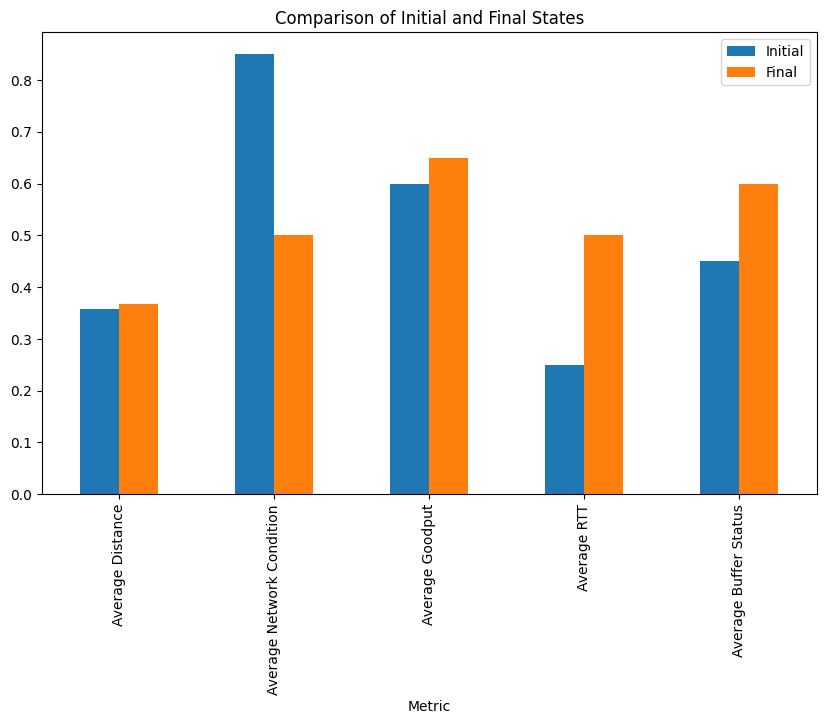

In [14]:
# Parameters
num_episodes = 100000
num_uavs = 10

# Roles  - 2 [0,1]
# Network Condition - 3 [0, 0.5, 1]
# Goodput - 3 [0, 0.5, 1]
# RTT - 3 [0, 0.5, 1]
# Buffer - 3 [0, 0.5, 1]
# Position 1x1 grid values from 0 to 1.0 at .1 increments 10 x 10 = 100
# Velocity x,y 9x8 = 81  [-0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4]
state_size = 2 * 3 * 3 * 3 * 100 * 81
print(f"State Size: {state_size}")

action_size = 10
max_steps = 50  # Maximum number of steps per episode

%cd /content/gdrive/MyDrive/Drones

# Train the Q-Learning agent and visualize the UAV network
agent_data = train_q_learning_agent(num_episodes, num_uavs, state_size,
                               action_size, max_steps)

# Get the current date and time
now = datetime.now()
timestamp = now.strftime("%Y%m%d_%H%M%S")

# Save the data with positions to a CSV file with date and time in the file name
file_name = f"uav-location-aware-data-{timestamp}.csv"
data.to_csv(file_name, index=False)

plot_data(data)

# Extract agent, initial states, and final states from agent_data
agent = agent_data[0]
initial_states = agent_data[1]
final_states = agent_data[2]

# Calculate metrics for initial and final states
initial_metrics = calculate_metrics(initial_states)
final_metrics = calculate_metrics(final_states)

# Create a DataFrame for comparison
metrics_df = pd.DataFrame({
    'Metric': ['Average Distance', 'Average Network Condition',
               'Average Goodput', 'Average RTT', 'Average Buffer Status'],
    'Initial': initial_metrics,
    'Final': final_metrics
})

# Save the data with positions to a CSV file with date and time in the file name
metrics_file_name = f"metrics_{timestamp}.csv"
metrics_df.to_csv(metrics_file_name, index=False)

# Plot the comparison
metrics_df.plot(x='Metric', kind='bar', figsize=(10, 6),
                title='Comparison of Initial and Final States')
plt.show()


